In [1]:
import sys
sys.path.append('../src/')
from modeling.utils.data import *
from modeling.utils.plotting import *
from modeling.utils.config import *
%load_ext autoreload
%autoreload 2

In [2]:
freq = 'daily'
months = 'MayJunJulAugSep'
obs_years = '1979-2021'
LAT, LONG = (20.,80.), (-90., 30.)
G = 9.80665

In [3]:
daily = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format(freq, months, obs_years))
daily

	func:'read_nc' took: 0.1380 sec


<xarray.Dataset>
Dimensions:    (expver: 2, latitude: 241, longitude: 481, time: 6579)
Coordinates:
  * longitude  (longitude) float32 -90.0 -89.75 -89.5 -89.25 ... 29.5 29.75 30.0
  * latitude   (latitude) float32 80.0 79.75 79.5 79.25 ... 20.5 20.25 20.0
  * expver     (expver) int32 1 5
  * time       (time) datetime64[ns] 1979-05-01 1979-05-02 ... 2021-09-30
Data variables:
    z          (time, expver, latitude, longitude) float32 ...

In [ ]:
daily = daily.where(np.logical_or(
                    daily['time.month'].isin([6,7,8]),
                    np.logical_or(
                        np.logical_and(daily['time.month'] == 5, daily['time.day'] >= 15),
                        np.logical_and(daily['time.month'] == 9, daily['time.day'] <= 15)
                    )),
                    drop = True)
daily

In [4]:
daily = daily.where(daily['time.month'].isin([6,7,8]), drop = True)

In [5]:
dt = xr.concat([daily.sel(time = slice("2021-07-31"), expver = 1),
                daily.sel(time = slice("2021-08-01", "2021-09-30"), expver = 5)],
                dim = "time")
dt = limit_geography(dt, LAT, LONG)
dt = dt / G

	func:'limit_geography' took: 4.5913 sec


In [6]:
#normal_dt = evaluate_normal(dt, domain='local', mode='flat', start_date = "01-01-1991")
#normal_dt = evaluate_normal(dt, domain ='local', mode ='dynamic', freq = 'm', start_date = "01-01-1991")
normal_dt = evaluate_normal(dt, domain ='local', mode ='dynamic', freq = 'w', start_date = "01-01-1991")

c:\python36\lib\site-packages\xarray\core\accessor_dt.py:379: FutureWarning:

dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.



	func:'evaluate_normal' took: 2.4603 sec


In [ ]:
locations = {
    "Oslo":(59.91, 10.76),
    "Paris": (48.86, 2.35),
    "Rome": (41.89, 12.51)
}
plot_normal(dt, locations, freq = 'm')

In [7]:
#anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='flat')
#anomaly_dt = evaluate_anomaly(dt.sel(time = slice(None, "31-12-2016")), normal_dt, mode='flat')
#anomaly_dt = evaluate_anomaly(dt.sel(time = slice(None, "31-12-2016")), normal_dt, mode='dynamic', freq = 'm')
#anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='dynamic', freq = 'm')
anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='dynamic', freq = 'w')
#to_nc(anomaly_dt, variable='anomaly')

c:\python36\lib\site-packages\xarray\core\accessor_dt.py:379: FutureWarning:

dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.



	func:'evaluate_anomaly' took: 3.8351 sec


In [8]:
ds = weighted_anomaly(anomaly_dt)
#to_nc(ds, variable = 'weighted_anomaly')

	func:'weighted_anomaly' took: 2.7759 sec


In [ ]:
for index in np.unique(ds.time.values):
    save_anomalies(ds.sel(time = index),
                   title = "W:/UK/Research/Private/WEATHER/STAGE_ABALDO/imgs/anomalies_img_weighted/anomaly_{}.png".\
                   format(index.astype('M8[D]').astype('O'), "%Y-%m-%d"))

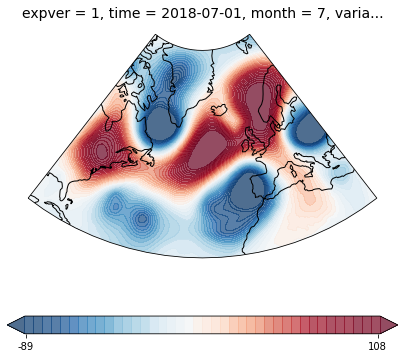

In [52]:
plot_gph(ds.sel(time='2018-07-01').to_array().squeeze())

In [9]:
pivot_anomaly = flat_table(ds)

	func:'flat_table' took: 0.8932 sec


In [13]:
eofs, pcs = eofs(pivot_anomaly)

	func:'eofs' took: 322.4524 sec


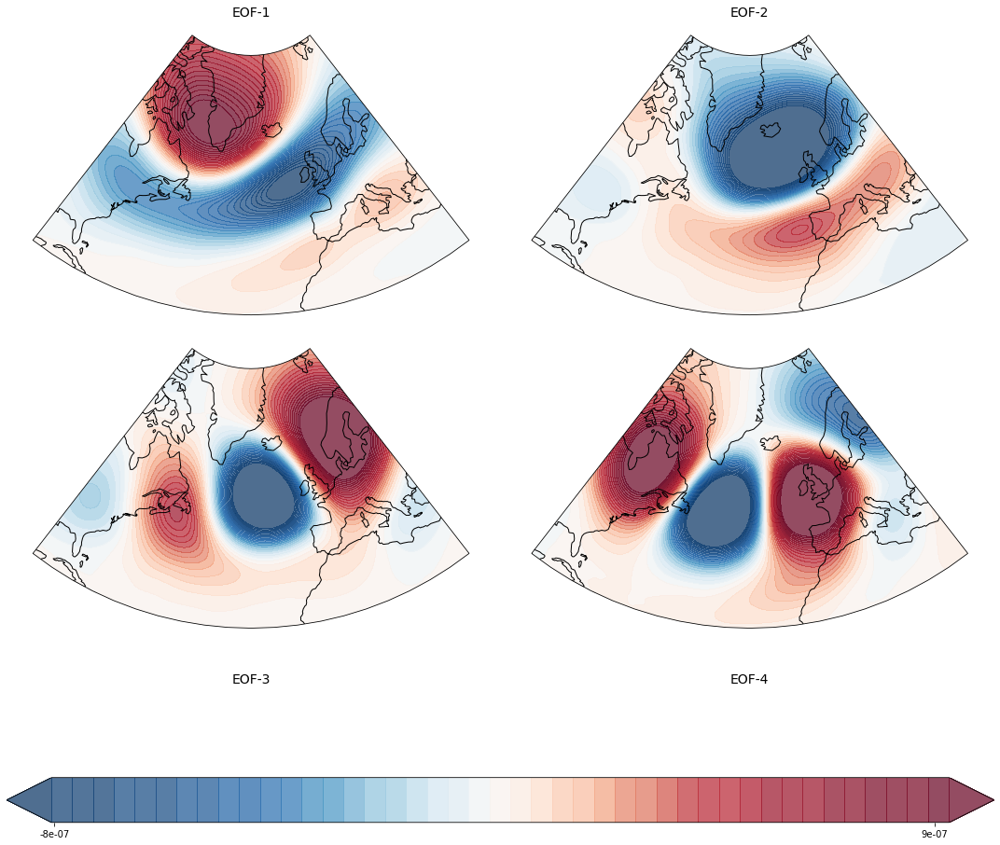

In [14]:
plot_EOFS(eofs)

In [23]:
@timing
def reduce_dim(dt, reshape='latlon', method='PCA', **kwargs):
    '''
    Args:
    - df: an xarray Dataset
    - method: the method used to perform dimensionality reduction, if not specified PCA is used
    - **kwargs: a dictionary of further parameters, like the percentage of explained variance used to retain the components

    Returns:
    - a numpy.array reduced in the feature space
    '''

    if method == 'PCA':
        if dt.ndim != 2:
            dt = dt.squeeze()
        pca = wrap(PCA(kwargs["exp_variance"] if "exp_variance" in kwargs else .95), reshapes=reshape)
        reduced_dt = pca.fit_transform(dt)

    elif method == "VAE":
        time_idx = dt.coords['time']
        vae = ConvVAE(args = Args(z_dim = 7))
        vae.load_state_dict(torch.load('../models/'+kwargs['season']+'/sigma_vae_statedict_7_refined', map_location='cpu'))
        dt = np.swapaxes(dt.to_array().values, 0, 1)
        dt = torch.from_numpy(dt).type(torch.FloatTensor)
        stack = []
        for i in range(0, len(dt), 256):
            print("\r", end="")
            print("Processing batch %d" % (i // 256 + 1), end="")

            batch = dt[i:i + 256, ...]
            with torch.no_grad():
                stack.append(vae(batch)[1])
        reduced_dt = xr.DataArray(torch.cat(stack).squeeze().detach().numpy(), coords=[time_idx, range(1, 8)])

    else:
        pass

    print("Number of days: %d, Density of the grid: %d cells" % (reduced_dt.shape[0], reduced_dt.shape[1]))
    return reduced_dt

In [21]:
#reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance=0.9)
reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance=5)

Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 7.1349 sec


In [24]:
reduced_anomaly = reduce_dim(ds, method='VAE', season = 'SUMMER')

Processing batch 16Number of days: 3956, Density of the grid: 7 cells
	func:'reduce_dim' took: 653.0539 sec


In [25]:
for model in ['kmeans','bayesian_gmm','gmm']:
    for scoring in  ["score", "ch", "bic", "silhouette"]:
        estimator = cross_val(reduced_anomaly.values, method = model, scoring = scoring, season = "SUMMER")

	Combination 1 score: -260898204.800
	Combination 2 score: -261768412.800
	Combination 3 score: -261768422.400
	Combination 4 score: -260567289.600
	Combination 5 score: -261520476.800
	Combination 6 score: -261768412.800
	Combination 7 score: -260567289.600
	Combination 8 score: -261179664.000
	Combination 9 score: -261768409.600
	Combination 10 score: -261504608.000
	Combination 11 score: -261761177.600
	Combination 12 score: -261761187.200
	Combination 13 score: -261758681.600
	Combination 14 score: -261761184.000
	Combination 15 score: -261018921.600
	Combination 16 score: -261758681.600
	Combination 17 score: -261761184.000
	Combination 18 score: -261761190.400
	Combination 19 score: -261817772.800
	Combination 20 score: -261754064.000
	Combination 21 score: -261754073.600
	Combination 22 score: -261817769.600
	Combination 23 score: -261754067.200
	Combination 24 score: -261524444.800
	Combination 25 score: -261817772.800
	Combination 26 score: -261754073.600
	Combination 27 score

	Combination 78 score: 143.874
	Combination 79 score: 143.711
	Combination 80 score: 143.874
	Combination 81 score: 143.874
	Combination 82 score: 143.653
	Combination 83 score: 143.822
	Combination 84 score: 143.822
	Combination 85 score: 143.653
	Combination 86 score: 143.822
	Combination 87 score: 143.822
	Combination 88 score: 143.653
	Combination 89 score: 143.822
	Combination 90 score: 143.822
	Combination 91 score: 143.840
	Combination 92 score: 143.951
	Combination 93 score: 143.951
	Combination 94 score: 143.840
	Combination 95 score: 143.951
	Combination 96 score: 143.951
	Combination 97 score: 143.840
	Combination 98 score: 143.951
	Combination 99 score: 143.951
	Combination 100 score: 143.850
	Combination 101 score: 143.898
	Combination 102 score: 143.886
	Combination 103 score: 143.850
	Combination 104 score: 143.898
	Combination 105 score: 143.886
	Combination 106 score: 143.850
	Combination 107 score: 143.898
	Combination 108 score: 143.886
	Combination 109 score: 133.93

	Combination 19 score: 0.229
	Combination 20 score: 0.230
	Combination 21 score: 0.230
	Combination 22 score: 0.229
	Combination 23 score: 0.230
	Combination 24 score: 0.230
	Combination 25 score: 0.229
	Combination 26 score: 0.230
	Combination 27 score: 0.230
	Combination 28 score: nan
	Combination 29 score: 0.230
	Combination 30 score: 0.230
	Combination 31 score: 0.230
	Combination 32 score: 0.230
	Combination 33 score: 0.230
	Combination 34 score: 0.230
	Combination 35 score: 0.230
	Combination 36 score: 0.230
	Combination 37 score: 0.186
	Combination 38 score: 0.185
	Combination 39 score: 0.185
	Combination 40 score: 0.186
	Combination 41 score: 0.185
	Combination 42 score: 0.185
	Combination 43 score: 0.186
	Combination 44 score: 0.185
	Combination 45 score: 0.185
	Combination 46 score: 0.185
	Combination 47 score: 0.185
	Combination 48 score: 0.185
	Combination 49 score: 0.185
	Combination 50 score: 0.185
	Combination 51 score: 0.185
	Combination 52 score: 0.185
	Combination 53 

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: -47.708
	Combination 4 score: -47.612


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 5 score: -47.617
	Combination 6 score: -47.978


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: -47.769


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 8 score: -47.628
	Combination 9 score: nan
	Combination 10 score: nan
	Combination 11 score: nan
	Combination 12 score: -47.772
	Combination 13 score: -47.784
	Combination 14 score: -47.679
	Combination 15 score: -47.998
	Combination 16 score: -47.812
	Combination 17 score: -47.616
	Combination 18 score: -47.858
	Combination 19 score: -47.937
	Combination 20 score: -47.896
	Combination 21 score: -47.622
	Combination 22 score: -47.638


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 23 score: -47.614


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 24 score: -47.612
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: nan
	Combination 28 score: -47.976
	Combination 29 score: -47.706
	Combination 30 score: -47.815
	Combination 31 score: -47.993
	Combination 32 score: -48.088


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 33 score: -47.532
	Combination 34 score: -47.532


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: -47.544


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 36 score: -47.694


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 37 score: -47.584


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 38 score: -47.534


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -47.555
	Combination 40 score: -48.154
	Combination 41 score: nan
	Combination 42 score: nan
	Combination 43 score: -47.531
	Combination 44 score: -48.184
	Combination 45 score: -47.838
	Combination 46 score: -47.645
	Combination 47 score: -48.082
	Combination 48 score: -48.250
	Combination 49 score: -47.554
	Combination 50 score: -47.641
	Combination 51 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 52 score: -47.542


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 53 score: -47.684
	Combination 54 score: -47.530


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 55 score: -47.730


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 56 score: -48.200
	Combination 57 score: nan
	Combination 58 score: nan
	Combination 59 score: -47.760
	Combination 60 score: nan
	Combination 61 score: -47.714
	Combination 62 score: -47.581
	Combination 63 score: nan
	Combination 64 score: -47.852
	Combination 65 score: -47.556


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 66 score: -47.509


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -47.483


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: -47.487


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 69 score: -47.472


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: -47.488


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -47.498


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 72 score: -47.521
	Combination 73 score: -47.753
	Combination 74 score: -47.791
	Combination 75 score: -47.877
	Combination 76 score: -47.933
	Combination 77 score: -47.609
	Combination 78 score: -47.845


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 79 score: nan
	Combination 80 score: -48.177
	Combination 81 score: nan
	Combination 82 score: -47.607


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 83 score: -47.488
	Combination 84 score: -47.515
	Combination 85 score: -47.718


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 86 score: -47.666


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: -47.604


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 88 score: -47.470
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: -47.701
	Combination 92 score: nan
	Combination 93 score: -47.842
	Combination 94 score: -47.537


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: -47.480
	Combination 98 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 99 score: -47.446


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 100 score: -47.499
	Combination 101 score: -47.678


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: -47.570


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: -47.457
	Combination 104 score: -47.863
	Combination 105 score: -47.495
	Combination 106 score: -47.807
	Combination 107 score: -47.967
	Combination 108 score: nan
	Combination 109 score: -47.483
	Combination 110 score: nan
	Combination 111 score: -48.040
	Combination 112 score: -47.780
	Combination 113 score: -47.597
	Combination 114 score: -47.672


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: -47.462
	Combination 116 score: nan
	Combination 117 score: -47.435


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 118 score: -47.726


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: -47.427
	Combination 120 score: -47.443
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: -47.673
	Combination 125 score: -47.544
	Combination 126 score: -47.688
	Combination 127 score: -47.507
	Combination 128 score: nan
Validation process ended with score -47.42698777269935
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 7, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 9845.8989 sec
	Combination 1 score: nan
	Combination 2 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 3 score: 91.804


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 4 score: 83.139


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 5 score: 90.473
	Combination 6 score: 70.125


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 7 score: 87.972
	Combination 8 score: nan
	Combination 9 score: nan
	Combination 10 score: nan
	Combination 11 score: 78.546
	Combination 12 score: nan
	Combination 13 score: 94.269
	Combination 14 score: nan
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 18 score: nan
	Combination 19 score: 123.171
	Combination 20 score: nan
	Combination 21 score: 96.473
	Combination 22 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 23 score: 89.126
	Combination 24 score: 98.269
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: 122.309
	Combination 28 score: nan
	Combination 29 score: 92.542
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: 60.311
	Combination 33 score: nan
	Combination 34 score: nan
	Combination 35 score: 90.569


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 36 score: 78.536


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 37 score: nan
	Combination 38 score: 79.422
	Combination 39 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: 87.674
	Combination 41 score: 90.133
	Combination 42 score: nan
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: 98.238
	Combination 46 score: 87.807
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: nan
	Combination 50 score: 85.326
	Combination 51 score: 95.786
	Combination 52 score: nan
	Combination 53 score: 104.351


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 54 score: 76.741


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 55 score: 77.503
	Combination 56 score: 87.558
	Combination 57 score: 86.776
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: 82.579
	Combination 61 score: 84.753
	Combination 62 score: 96.188
	Combination 63 score: 60.341
	Combination 64 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 65 score: 66.403
	Combination 66 score: 78.061


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: 73.899


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 68 score: 68.741
	Combination 69 score: 63.935
	Combination 70 score: 73.370


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: 68.948


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 72 score: 73.092
	Combination 73 score: 87.917
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: 51.730
	Combination 77 score: 81.680
	Combination 78 score: 77.917
	Combination 79 score: 68.273
	Combination 80 score: 49.497
	Combination 81 score: 77.100
	Combination 82 score: 75.119


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: 72.443


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 84 score: nan
	Combination 85 score: 67.239
	Combination 86 score: 63.170
	Combination 87 score: 77.300


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 88 score: 67.414
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: nan
	Combination 94 score: 82.184
	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: nan
	Combination 98 score: 69.292


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: 81.451


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 100 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 101 score: 58.250


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 102 score: 73.779


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: 75.107


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: 67.082
	Combination 105 score: nan
	Combination 106 score: nan
	Combination 107 score: 69.167
	Combination 108 score: nan
	Combination 109 score: 77.677
	Combination 110 score: 94.455
	Combination 111 score: 114.970
	Combination 112 score: 78.996
	Combination 113 score: nan
	Combination 114 score: 82.257


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 116 score: 60.719
	Combination 117 score: 74.791
	Combination 118 score: 48.428


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: 63.935


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 120 score: 64.724
	Combination 121 score: 76.586
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: 99.693
	Combination 125 score: 87.967
	Combination 126 score: 90.006
	Combination 127 score: 75.318
	Combination 128 score: nan
Validation process ended with score 123.17147314444408
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 10349.4374 sec
	Combination 1 score: nan
	Combination 2 score: -39598.483


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: nan
	Combination 4 score: -39531.135


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 5 score: -39522.077
	Combination 6 score: -39402.440


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: -39378.862


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 8 score: -39267.904
	Combination 9 score: nan
	Combination 10 score: nan
	Combination 11 score: -39241.585
	Combination 12 score: -39290.126
	Combination 13 score: -39495.276
	Combination 14 score: -39184.836
	Combination 15 score: -39393.781
	Combination 16 score: -39502.206
	Combination 17 score: -40153.132
	Combination 18 score: -39306.714
	Combination 19 score: -39244.705
	Combination 20 score: -39576.462
	Combination 21 score: -39389.984
	Combination 22 score: -39340.402


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 23 score: -39802.945


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 24 score: -39409.459
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: -39211.578
	Combination 28 score: -39269.075
	Combination 29 score: -39263.732
	Combination 30 score: -39357.532
	Combination 31 score: -39361.495
	Combination 32 score: -39502.204


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 33 score: -39545.910
	Combination 34 score: -40522.589


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: -39543.623


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 36 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 37 score: -39897.338
	Combination 38 score: -39547.255


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -40229.368


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: -39494.942
	Combination 41 score: -39416.067
	Combination 42 score: -39742.473
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: -39440.365
	Combination 46 score: -39310.235
	Combination 47 score: -39340.068
	Combination 48 score: -39358.728
	Combination 49 score: nan
	Combination 50 score: -39421.193


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 51 score: nan
	Combination 52 score: -40042.516
	Combination 53 score: -39544.659
	Combination 54 score: -39707.671
	Combination 55 score: -39483.703


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 56 score: -39510.560
	Combination 57 score: nan
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: -39587.973
	Combination 62 score: -39369.831
	Combination 63 score: -39516.683
	Combination 64 score: -39811.854
	Combination 65 score: nan
	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -40195.649


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: -39728.386
	Combination 69 score: -40342.399


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: -39519.413


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -39567.905


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 72 score: -39939.492
	Combination 73 score: -39448.923
	Combination 74 score: -39364.617
	Combination 75 score: nan
	Combination 76 score: -39364.592
	Combination 77 score: -39478.036
	Combination 78 score: nan
	Combination 79 score: -39405.352
	Combination 80 score: -39394.880
	Combination 81 score: -39252.703
	Combination 82 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: -39607.327


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 84 score: -39639.648
	Combination 85 score: -39773.105
	Combination 86 score: -39888.299


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: -39973.478


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 88 score: -39861.079
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: -39443.018
	Combination 92 score: nan
	Combination 93 score: -39549.086
	Combination 94 score: -39650.793
	Combination 95 score: -39443.614
	Combination 96 score: -39695.774


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 97 score: -40546.482
	Combination 98 score: -39557.532


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 100 score: -39519.870


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 101 score: -39748.979


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: -39568.268


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 103 score: -39759.595


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: -40360.795
	Combination 105 score: -39493.649
	Combination 106 score: nan
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: -39534.669
	Combination 110 score: -39878.660
	Combination 111 score: -39827.998
	Combination 112 score: -39555.265
	Combination 113 score: nan
	Combination 114 score: -40248.568


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: -39573.779
	Combination 116 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 117 score: -39874.273
	Combination 118 score: -39590.566


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: -39849.227


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 120 score: -39635.034
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: -39452.613
	Combination 124 score: -39630.907
	Combination 125 score: -39572.481
	Combination 126 score: -39531.063
	Combination 127 score: -39372.672
	Combination 128 score: -39367.676
Validation process ended with score -39184.83648865398
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 9789.4447 sec
	Combination 1 score: 0.072
	Combination 2 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 3 score: 0.039


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 4 score: 0.038
	Combination 5 score: 0.046
	Combination 6 score: -0.016


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: 0.049
	Combination 8 score: nan
	Combination 9 score: 0.032
	Combination 10 score: nan
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: 0.051
	Combination 14 score: 0.030
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: nan
	Combination 18 score: 0.061
	Combination 19 score: 0.031


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 20 score: 0.036
	Combination 21 score: 0.034
	Combination 22 score: 0.042


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 23 score: 0.038


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 24 score: 0.051
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: 0.073
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: 0.015


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 34 score: -0.003


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 35 score: -0.002
	Combination 36 score: 0.012


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 37 score: 0.016


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 38 score: 0.017


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: 0.016
	Combination 40 score: 0.010
	Combination 41 score: -0.045
	Combination 42 score: -0.003
	Combination 43 score: 0.025
	Combination 44 score: nan
	Combination 45 score: -0.002
	Combination 46 score: 0.058
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: nan
	Combination 50 score: 0.042
	Combination 51 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 52 score: -0.018
	Combination 53 score: -0.017
	Combination 54 score: -0.001


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 55 score: 0.006


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 56 score: 0.015
	Combination 57 score: 0.025
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: 0.007
	Combination 62 score: 0.027
	Combination 63 score: nan
	Combination 64 score: nan
	Combination 65 score: 0.079
	Combination 66 score: -0.032


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: 0.007
	Combination 68 score: -0.068


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 69 score: 0.017
	Combination 70 score: 0.036


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: 0.011


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 72 score: 0.041
	Combination 73 score: 0.022
	Combination 74 score: 0.012
	Combination 75 score: nan
	Combination 76 score: 0.071
	Combination 77 score: 0.008
	Combination 78 score: -0.084
	Combination 79 score: 0.027
	Combination 80 score: 0.019
	Combination 81 score: nan
	Combination 82 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: -0.003
	Combination 84 score: 0.016
	Combination 85 score: 0.008
	Combination 86 score: 0.022


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: -0.014


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 88 score: 0.021
	Combination 89 score: nan
	Combination 90 score: -0.002
	Combination 91 score: nan
	Combination 92 score: -0.023
	Combination 93 score: 0.015
	Combination 94 score: 0.035
	Combination 95 score: nan
	Combination 96 score: 0.042
	Combination 97 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 98 score: 0.020


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: -0.001


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 100 score: nan
	Combination 101 score: 0.008


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: 0.029


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: 0.040
	Combination 104 score: 0.021
	Combination 105 score: nan
	Combination 106 score: 0.008
	Combination 107 score: nan
	Combination 108 score: 0.096
	Combination 109 score: 0.009
	Combination 110 score: 0.022
	Combination 111 score: -0.061
	Combination 112 score: 0.009
	Combination 113 score: nan
	Combination 114 score: nan
	Combination 115 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 116 score: nan
	Combination 117 score: -0.047
	Combination 118 score: -0.009


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: 0.009
	Combination 120 score: -0.009
	Combination 121 score: -0.012
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: 0.058
	Combination 126 score: nan
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 0.09621210396289825
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 7, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 10650.0248 sec
	Combination 1 score: nan
	Combination 2 score: -47.587


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: -47.584
	Combination 4 score: -47.589
	Combination 5 score: -47.589
	Combination 6 score: -47.590
	Combination 7 score: -47.592
	Combination 8 score: -47.600
	Combination 9 score: -47.585
	Combination 10 score: -47.589
	Combination 11 score: -47.590


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 12 score: -47.587
	Combination 13 score: -47.591
	Combination 14 score: -47.586
	Combination 15 score: -47.592
	Combination 16 score: -47.586
	Combination 17 score: -47.589
	Combination 18 score: -47.594
	Combination 19 score: -47.591
	Combination 20 score: -47.587
	Combination 21 score: -47.596
	Combination 22 score: -47.591
	Combination 23 score: -47.588
	Combination 24 score: -47.591
	Combination 25 score: -47.594
	Combination 26 score: -47.590
	Combination 27 score: -47.588
	Combination 28 score: -47.589
	Combination 29 score: -47.588


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 30 score: -47.586
	Combination 31 score: -47.590
	Combination 32 score: -47.590
	Combination 33 score: -47.585
	Combination 34 score: -47.588
	Combination 35 score: -47.594
	Combination 36 score: -47.590
	Combination 37 score: -47.593
	Combination 38 score: -47.586
	Combination 39 score: -47.591
	Combination 40 score: -47.591
	Combination 41 score: -47.591


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: -47.589
	Combination 43 score: -47.593
	Combination 44 score: -47.586
	Combination 45 score: -47.599
	Combination 46 score: -47.592
	Combination 47 score: -47.591
	Combination 48 score: -47.597
	Combination 49 score: -47.591
	Combination 50 score: -47.592
	Combination 51 score: -47.585
	Combination 52 score: -47.591
	Combination 53 score: -47.592
	Combination 54 score: -47.591
	Combination 55 score: -47.589
	Combination 56 score: -47.598


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 57 score: -47.589
	Combination 58 score: -47.589
	Combination 59 score: -47.593
	Combination 60 score: -47.587
	Combination 61 score: -47.593
	Combination 62 score: -47.590
	Combination 63 score: -47.588
	Combination 64 score: -47.589
	Combination 65 score: -47.591
	Combination 66 score: -47.589
	Combination 67 score: -47.589
	Combination 68 score: -47.588
	Combination 69 score: -47.588
	Combination 70 score: -47.590
	Combination 71 score: -47.595
	Combination 72 score: -47.587
	Combination 73 score: -47.590
	Combination 74 score: -47.599


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: -47.587
	Combination 76 score: -47.589
	Combination 77 score: -47.590
	Combination 78 score: -47.588
	Combination 79 score: -47.588
	Combination 80 score: -47.589
	Combination 81 score: -47.589
	Combination 82 score: -47.591
	Combination 83 score: -47.587
	Combination 84 score: -47.588
	Combination 85 score: -47.595
	Combination 86 score: -47.590
	Combination 87 score: -47.590
	Combination 88 score: -47.590
	Combination 89 score: -47.592
	Combination 90 score: -47.596
	Combination 91 score: -47.596
	Combination 92 score: -47.591
	Combination 93 score: -47.590
	Combination 94 score: -47.594
	Combination 95 score: -47.592
	Combination 96 score: -47.593
	Combination 97 score: -47.591
	Combination 98 score: -47.594
	Combination 99 score: -47.597
	Combination 100 score: -47.591
	Combination 101 score: -47.586
	Combination 102 score: -47.591
	Combination 103 score: -47.590
	Combination 104 score: -47.590
	Combination 105 score: -47.600
	Combination 106 score: -47.591
	

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 132 score: -47.588
	Combination 133 score: -47.593
	Combination 134 score: -47.591
	Combination 135 score: -47.593
	Combination 136 score: -47.593
	Combination 137 score: -47.592
	Combination 138 score: -47.591
	Combination 139 score: -47.589
	Combination 140 score: -47.599
	Combination 141 score: -47.582
	Combination 142 score: -47.592
	Combination 143 score: -47.591
	Combination 144 score: -47.587
Validation process ended with score -47.58165871902089
Best parameters: {'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 1000, 'means_init': None, 'n_components': 7, 'n_init': 10, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 165.0575 sec
	Combination 1 score: nan
	Combination 2 score: 92.467
	Combination 3 score: 88.927
	Combination 4 score: 87.189
	Combination 5 score: 88.073


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: 88.891
	Combination 7 score: 85.300
	Combination 8 score: 86.052
	Combination 9 score: 82.918
	Combination 10 score: 84.186
	Combination 11 score: 85.151
	Combination 12 score: 86.620
	Combination 13 score: 86.307
	Combination 14 score: 86.661
	Combination 15 score: 84.477
	Combination 16 score: 83.444
	Combination 17 score: 84.435
	Combination 18 score: 85.253
	Combination 19 score: 85.603
	Combination 20 score: 84.303
	Combination 21 score: 84.851
	Combination 22 score: 84.906
	Combination 23 score: 84.993


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 24 score: 84.469
	Combination 25 score: 85.458
	Combination 26 score: 85.198
	Combination 27 score: 85.794
	Combination 28 score: 85.062
	Combination 29 score: 86.901
	Combination 30 score: 87.588
	Combination 31 score: 86.039
	Combination 32 score: 85.886
	Combination 33 score: 86.002
	Combination 34 score: 84.596
	Combination 35 score: 85.931
	Combination 36 score: 85.959
	Combination 37 score: 85.129
	Combination 38 score: 84.483
	Combination 39 score: 87.521
	Combination 40 score: 87.130
	Combination 41 score: 85.382
	Combination 42 score: 86.755
	Combination 43 score: 86.627
	Combination 44 score: 86.333
	Combination 45 score: 85.994
	Combination 46 score: 85.708
	Combination 47 score: 85.680
	Combination 48 score: 85.328
	Combination 49 score: 86.631
	Combination 50 score: 86.034
	Combination 51 score: 85.465
	Combination 52 score: 86.720
	Combination 53 score: 86.501
	Combination 54 score: 85.477
	Combination 55 score: 84.534
	Combination 56 score: 86.154
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 66 score: 86.669
	Combination 67 score: 84.698
	Combination 68 score: 85.961
	Combination 69 score: 87.068
	Combination 70 score: 85.967
	Combination 71 score: 83.632
	Combination 72 score: 85.044
	Combination 73 score: 86.230
	Combination 74 score: 86.927
	Combination 75 score: 86.408
	Combination 76 score: 84.630
	Combination 77 score: 86.392
	Combination 78 score: 86.434
	Combination 79 score: 86.520
	Combination 80 score: 84.946
	Combination 81 score: 87.282
	Combination 82 score: 87.324
	Combination 83 score: 86.368
	Combination 84 score: 86.313
	Combination 85 score: 85.405
	Combination 86 score: 85.236
	Combination 87 score: 85.844
	Combination 88 score: 86.197
	Combination 89 score: 86.413
	Combination 90 score: 82.918
	Combination 91 score: 84.680
	Combination 92 score: 85.492
	Combination 93 score: 87.188
	Combination 94 score: 86.780
	Combination 95 score: 86.185
	Combination 96 score: 85.522
	Combination 97 score: 86.126
	Combination 98 score: 85.970
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: 85.036
	Combination 103 score: 85.468
	Combination 104 score: 84.563
	Combination 105 score: 85.263
	Combination 106 score: 86.250
	Combination 107 score: 87.107
	Combination 108 score: 87.286
	Combination 109 score: 86.426
	Combination 110 score: 85.511
	Combination 111 score: 86.364
	Combination 112 score: 88.055
	Combination 113 score: 85.990
	Combination 114 score: 85.117
	Combination 115 score: 86.735
	Combination 116 score: 84.592
	Combination 117 score: 86.221
	Combination 118 score: 83.135
	Combination 119 score: 84.969
	Combination 120 score: 85.815
	Combination 121 score: 87.408
	Combination 122 score: 85.880
	Combination 123 score: 86.278
	Combination 124 score: 88.112
	Combination 125 score: 86.463
	Combination 126 score: 85.106
	Combination 127 score: 84.480
	Combination 128 score: 85.297
	Combination 129 score: 86.493
	Combination 130 score: 86.796
	Combination 131 score: 86.622
	Combination 132 score: 84.658
	Combination 133 score: 84.521
	Combina

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: -76257.635
	Combination 7 score: -76256.113
	Combination 8 score: -76257.776
	Combination 9 score: -76255.937
	Combination 10 score: -76256.814
	Combination 11 score: -76264.324
	Combination 12 score: -76261.629
	Combination 13 score: -76258.039
	Combination 14 score: -76257.976
	Combination 15 score: -76267.639
	Combination 16 score: -76270.695
	Combination 17 score: -76268.332
	Combination 18 score: -76254.936
	Combination 19 score: -76258.740
	Combination 20 score: -76253.857


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 21 score: -76287.289
	Combination 22 score: -76259.439
	Combination 23 score: -76257.798
	Combination 24 score: -76264.531
	Combination 25 score: -76266.699
	Combination 26 score: -76254.563
	Combination 27 score: -76255.575
	Combination 28 score: -76264.156
	Combination 29 score: -76270.089
	Combination 30 score: -76252.411
	Combination 31 score: -76259.145
	Combination 32 score: -76266.438
	Combination 33 score: -76266.210
	Combination 34 score: -76257.994
	Combination 35 score: -76255.566
	Combination 36 score: -76253.173
	Combination 37 score: -76502.803
	Combination 38 score: -76496.128


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -76498.663
	Combination 40 score: -76502.214
	Combination 41 score: -76512.869
	Combination 42 score: -76500.012
	Combination 43 score: -76501.504
	Combination 44 score: -76504.316
	Combination 45 score: -76493.927
	Combination 46 score: -76502.610
	Combination 47 score: -76502.370


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 48 score: -76505.199
	Combination 49 score: -76500.877
	Combination 50 score: -76500.958
	Combination 51 score: -76500.296
	Combination 52 score: -76499.798
	Combination 53 score: -76495.916
	Combination 54 score: -76496.059
	Combination 55 score: -76500.419
	Combination 56 score: -76499.532


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 57 score: -76491.021
	Combination 58 score: -76494.745
	Combination 59 score: -76515.478
	Combination 60 score: -76498.040
	Combination 61 score: -76500.634
	Combination 62 score: -76508.808
	Combination 63 score: -76512.205
	Combination 64 score: -76497.932
	Combination 65 score: -76522.014
	Combination 66 score: -76506.829
	Combination 67 score: -76504.612
	Combination 68 score: -76502.254
	Combination 69 score: -76495.078
	Combination 70 score: -76500.264
	Combination 71 score: -76508.616
	Combination 72 score: -76499.205
	Combination 73 score: -76742.096
	Combination 74 score: -76756.137


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: -76744.184
	Combination 76 score: -76738.627
	Combination 77 score: -76739.518


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 78 score: -76755.462
	Combination 79 score: -76739.989
	Combination 80 score: -76741.527
	Combination 81 score: -76742.268
	Combination 82 score: -76743.499
	Combination 83 score: -76735.303
	Combination 84 score: -76740.976
	Combination 85 score: -76746.036
	Combination 86 score: -76742.477
	Combination 87 score: -76738.924
	Combination 88 score: -76746.203
	Combination 89 score: -76741.184
	Combination 90 score: -76762.629
	Combination 91 score: -76738.125
	Combination 92 score: -76751.410
	Combination 93 score: -76750.950
	Combination 94 score: -76756.186
	Combination 95 score: -76739.504
	Combination 96 score: -76744.076
	Combination 97 score: -76741.366
	Combination 98 score: -76741.740
	Combination 99 score: -76763.650
	Combination 100 score: -76758.983
	Combination 101 score: -76754.154
	Combination 102 score: -76775.477
	Combination 103 score: -76739.088
	Combination 104 score: -76741.650
	Combination 105 score: -76732.550
	Combination 106 score: -76747.640
	Combin

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 111 score: -76981.759
	Combination 112 score: -76984.157
	Combination 113 score: -76986.609
	Combination 114 score: -76986.506
	Combination 115 score: -76981.656
	Combination 116 score: -76972.713
	Combination 117 score: -76987.717
	Combination 118 score: -76988.566
	Combination 119 score: -76982.584
	Combination 120 score: -76982.213
	Combination 121 score: -76980.108
	Combination 122 score: -76992.082
	Combination 123 score: -76992.869
	Combination 124 score: -76980.449
	Combination 125 score: -76980.991
	Combination 126 score: -76973.825
	Combination 127 score: -76979.920
	Combination 128 score: -76996.114
	Combination 129 score: -77004.135
	Combination 130 score: -76983.756
	Combination 131 score: -76991.711
	Combination 132 score: -76973.479
	Combination 133 score: -76981.118
	Combination 134 score: -76995.019
	Combination 135 score: -76986.400
	Combination 136 score: -76982.630
	Combination 137 score: -76984.571


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 138 score: -76980.717
	Combination 139 score: -76981.639
	Combination 140 score: -76982.030
	Combination 141 score: -76981.554
	Combination 142 score: -76983.158
	Combination 143 score: -76999.092
	Combination 144 score: -76975.106
Validation process ended with score -76252.41050996403
Best parameters: {'covariance_type': 'full', 'init_params': 'random', 'max_iter': 300, 'means_init': None, 'n_components': 4, 'n_init': 10, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 235.8538 sec
	Combination 1 score: nan
	Combination 2 score: 0.024


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 0.022
	Combination 4 score: 0.024
	Combination 5 score: 0.022
	Combination 6 score: 0.020
	Combination 7 score: 0.019
	Combination 8 score: 0.019
	Combination 9 score: 0.021
	Combination 10 score: 0.019
	Combination 11 score: 0.019
	Combination 12 score: 0.019
	Combination 13 score: 0.019
	Combination 14 score: 0.020
	Combination 15 score: 0.018
	Combination 16 score: 0.015
	Combination 17 score: 0.019
	Combination 18 score: 0.019
	Combination 19 score: 0.022
	Combination 20 score: 0.020
	Combination 21 score: 0.020
	Combination 22 score: 0.021
	Combination 23 score: 0.020
	Combination 24 score: 0.021
	Combination 25 score: 0.023
	Combination 26 score: 0.022
	Combination 27 score: 0.019
	Combination 28 score: 0.023
	Combination 29 score: 0.023
	Combination 30 score: 0.019
	Combination 31 score: 0.022
	Combination 32 score: 0.020
	Combination 33 score: 0.020
	Combination 34 score: 0.023
	Combination 35 score: 0.023
	Combination 36 score: 0.016
	Combination 37 score

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: 0.020
	Combination 43 score: 0.020
	Combination 44 score: 0.019
	Combination 45 score: 0.018
	Combination 46 score: 0.019
	Combination 47 score: 0.017
	Combination 48 score: 0.024
	Combination 49 score: 0.023
	Combination 50 score: 0.024
	Combination 51 score: 0.018
	Combination 52 score: 0.020
	Combination 53 score: 0.020
	Combination 54 score: 0.017
	Combination 55 score: 0.017
	Combination 56 score: 0.016
	Combination 57 score: 0.018
	Combination 58 score: 0.019
	Combination 59 score: 0.021
	Combination 60 score: 0.019
	Combination 61 score: 0.019
	Combination 62 score: 0.019
	Combination 63 score: 0.020
	Combination 64 score: 0.023
	Combination 65 score: 0.023
	Combination 66 score: 0.022
	Combination 67 score: 0.022
	Combination 68 score: 0.020
	Combination 69 score: 0.021
	Combination 70 score: 0.016
	Combination 71 score: 0.019
	Combination 72 score: 0.019
	Combination 73 score: 0.022
	Combination 74 score: 0.023


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: 0.024
	Combination 76 score: 0.024
	Combination 77 score: 0.021


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 78 score: 0.025
	Combination 79 score: 0.025
	Combination 80 score: 0.022
	Combination 81 score: 0.024
	Combination 82 score: 0.026
	Combination 83 score: 0.022
	Combination 84 score: 0.024
	Combination 85 score: 0.025
	Combination 86 score: 0.021
	Combination 87 score: 0.022
	Combination 88 score: 0.019
	Combination 89 score: 0.021
	Combination 90 score: 0.020
	Combination 91 score: 0.020
	Combination 92 score: 0.019


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 93 score: 0.020
	Combination 94 score: 0.018
	Combination 95 score: 0.018


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 96 score: 0.018
	Combination 97 score: 0.017
	Combination 98 score: 0.016
	Combination 99 score: 0.020
	Combination 100 score: 0.021
	Combination 101 score: 0.019
	Combination 102 score: 0.023
	Combination 103 score: 0.024
	Combination 104 score: 0.023
	Combination 105 score: 0.028
	Combination 106 score: 0.028
	Combination 107 score: 0.022
	Combination 108 score: 0.022
	Combination 109 score: 0.020
	Combination 110 score: 0.018
	Combination 111 score: 0.019
	Combination 112 score: 0.019
	Combination 113 score: 0.018


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 114 score: 0.022
	Combination 115 score: 0.019
	Combination 116 score: 0.016
	Combination 117 score: 0.019
	Combination 118 score: 0.019
	Combination 119 score: 0.026


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 120 score: 0.023
	Combination 121 score: 0.024
	Combination 122 score: 0.024
	Combination 123 score: 0.023
	Combination 124 score: 0.023
	Combination 125 score: 0.021
	Combination 126 score: 0.021
	Combination 127 score: 0.020
	Combination 128 score: 0.019


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 129 score: 0.023
	Combination 130 score: 0.024
	Combination 131 score: 0.022


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 132 score: 0.025
	Combination 133 score: 0.026
	Combination 134 score: 0.024
	Combination 135 score: 0.018
	Combination 136 score: 0.020
	Combination 137 score: 0.020
	Combination 138 score: 0.019
	Combination 139 score: 0.023
	Combination 140 score: 0.025
	Combination 141 score: 0.022
	Combination 142 score: 0.028
	Combination 143 score: 0.024
	Combination 144 score: 0.024
Validation process ended with score 0.028276583179831505
Best parameters: {'covariance_type': 'full', 'init_params': 'random', 'max_iter': 1000, 'means_init': None, 'n_components': 7, 'n_init': 10, 'precisions_init': None, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': True, 'weights_init': None}
	func:'cross_val' took: 269.2794 sec


In [27]:
train_X, test_X = train_test_split(reduced_anomaly, test_size = .2)

### PCA: 5 Months

In [17]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-259128.985683,-0.042559,24.799182,4.819940e+11
bayesian_gmm_model_ch.pkl,6,-259255.169221,0.005901,29.253906,4.595783e+11
bayesian_gmm_model_score.pkl,6,-259294.402323,-0.066333,16.183712,4.797283e+11
bayesian_gmm_model_silhouette.pkl,7,-259300.191829,-0.037155,29.797579,4.489431e+11
gmm_model_bic.pkl,4,-259118.394001,0.005702,37.311743,4.691386e+11
gmm_model_ch.pkl,4,-259096.763263,0.001369,39.170801,4.671494e+11
gmm_model_score.pkl,7,-259101.011549,0.001518,38.947120,4.673096e+11
gmm_model_silhouette.pkl,4,-259084.455533,0.001974,39.303032,4.669829e+11
kmeans_model_bic.pkl,7,-257295.638267,0.062160,76.284952,3.779100e+11
kmeans_model_ch.pkl,4,-257436.075058,0.074001,104.123006,4.106219e+11


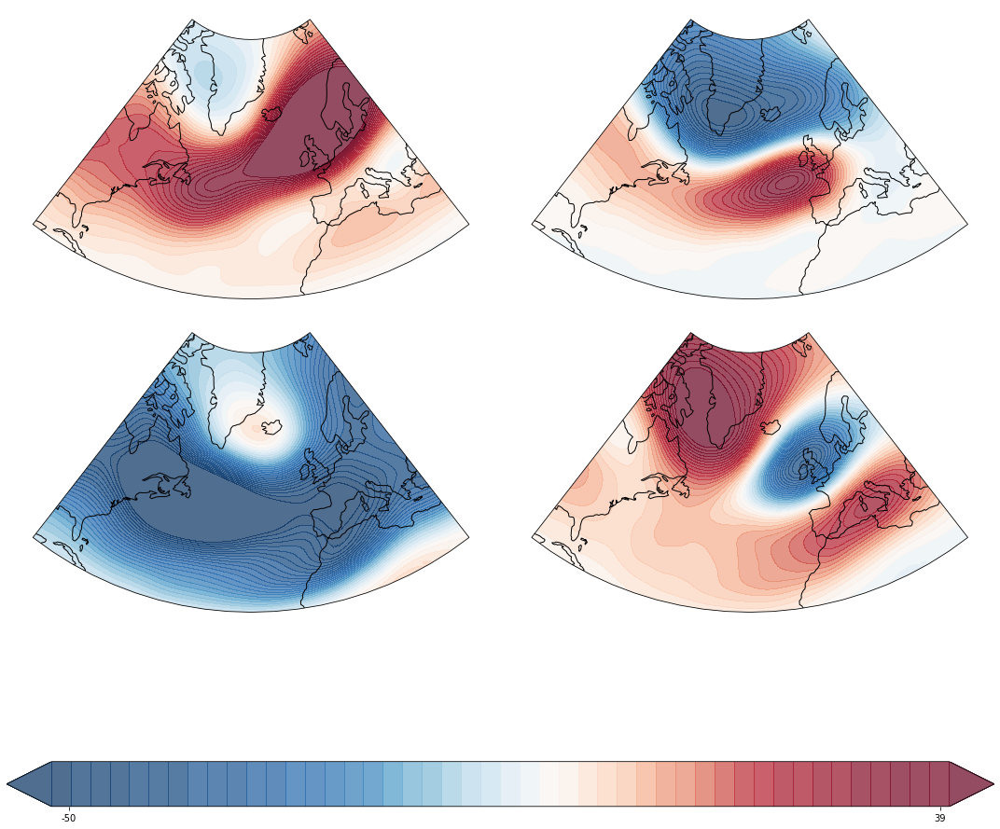

In [13]:
estimator = load_estimator('../models/SUMMER/pca_5months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



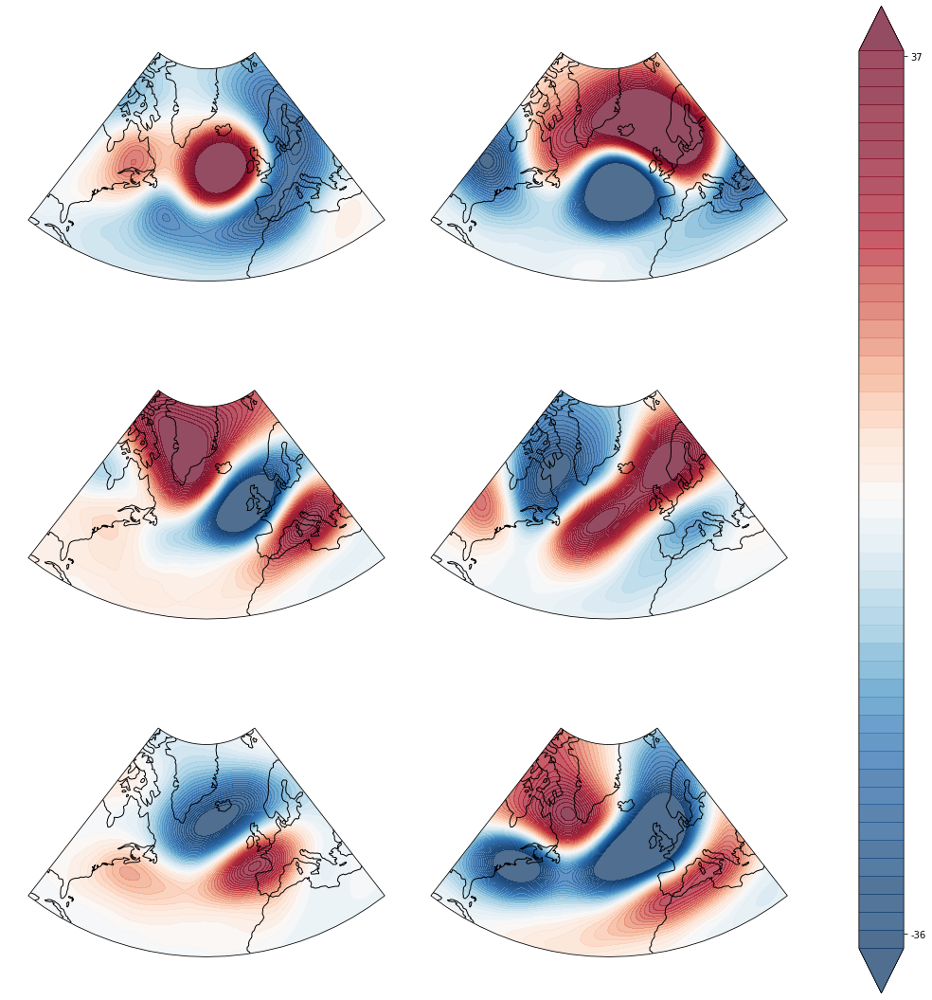

In [14]:
estimator = load_estimator("../models/SUMMER/pca/bayesian_gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

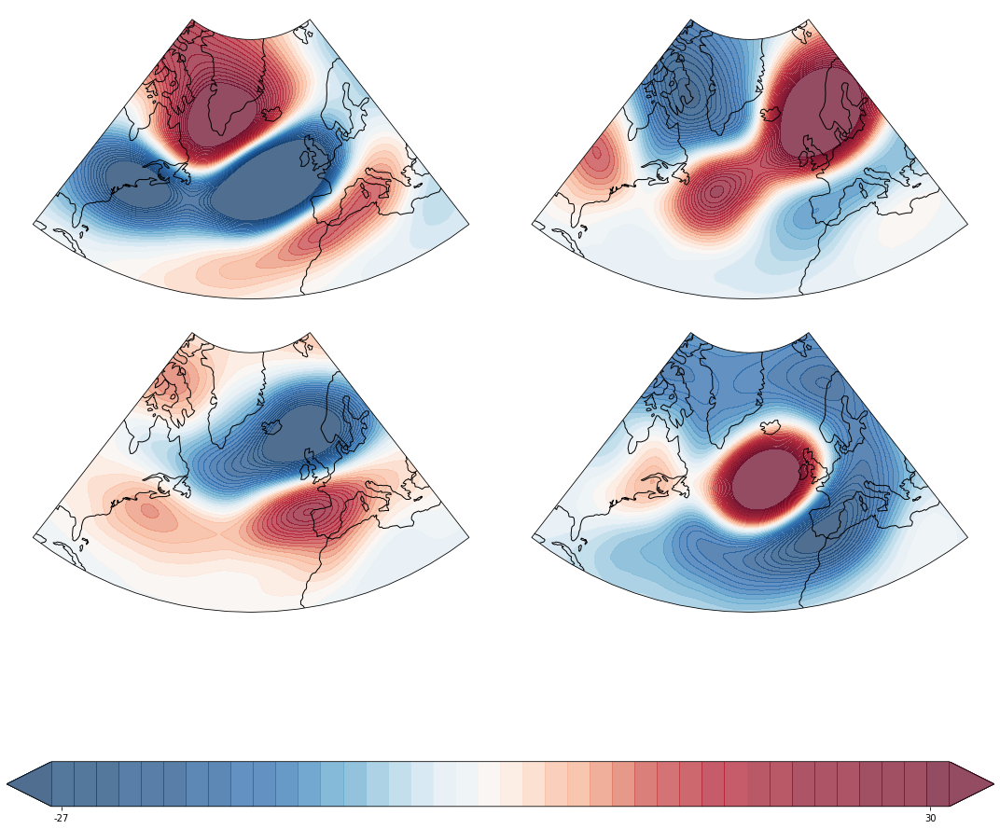

In [21]:
estimator = load_estimator("../models/SUMMER/pca/gmm_model_silhouette.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### VAE: 5 Months

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check f

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-43815.929920,0.026472,81.840459,2.370001e+09
bayesian_gmm_model_ch.pkl,5,-43921.887772,0.031431,78.649481,2.252241e+09
bayesian_gmm_model_score.pkl,7,-44110.652476,0.035359,72.975511,2.081303e+09
bayesian_gmm_model_silhouette.pkl,4,-43812.160851,0.027493,81.230524,2.371569e+09
gmm_model_bic.pkl,4,-43818.426627,0.026194,81.368170,2.372380e+09
gmm_model_ch.pkl,4,-43798.241360,0.026456,80.957465,2.371222e+09
gmm_model_score.pkl,5,-43719.576023,0.045948,95.669956,2.295145e+09
gmm_model_silhouette.pkl,4,-43809.015604,0.023767,79.627367,2.377958e+09
kmeans_model_bic.pkl,7,-43064.104789,0.163302,184.140875,1.427821e+09
kmeans_model_ch.pkl,4,-43073.857413,0.167389,209.964522,1.828358e+09


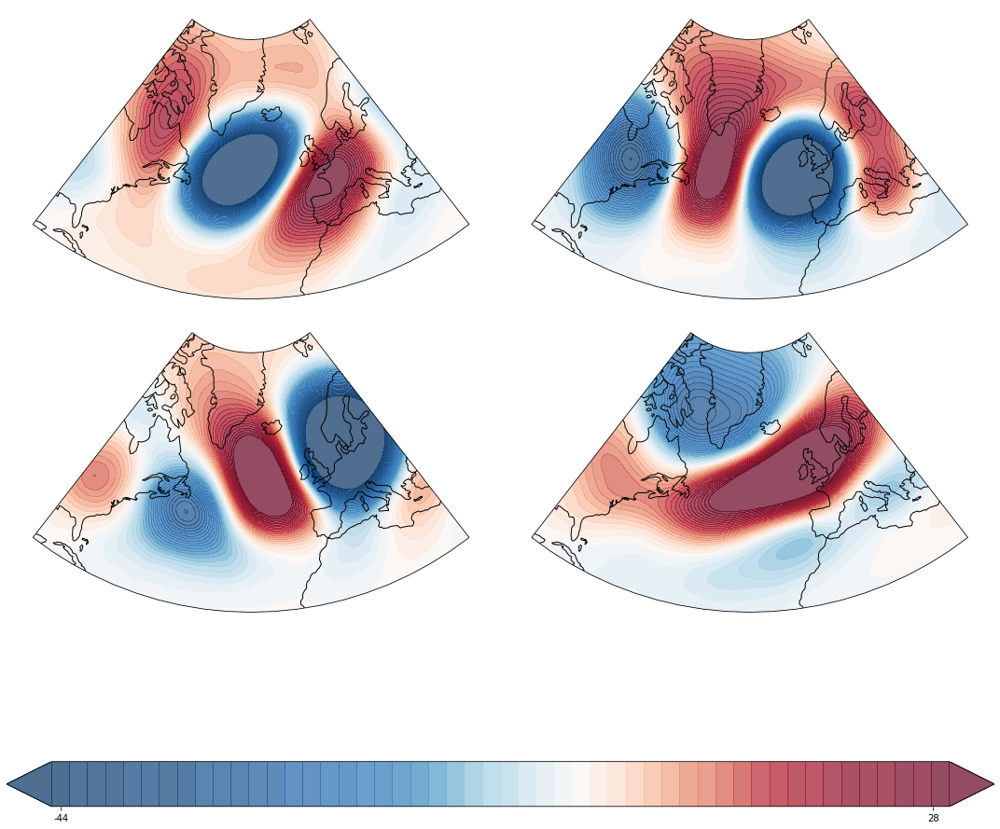

In [15]:
estimator = load_estimator('../models/SUMMER/vae/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

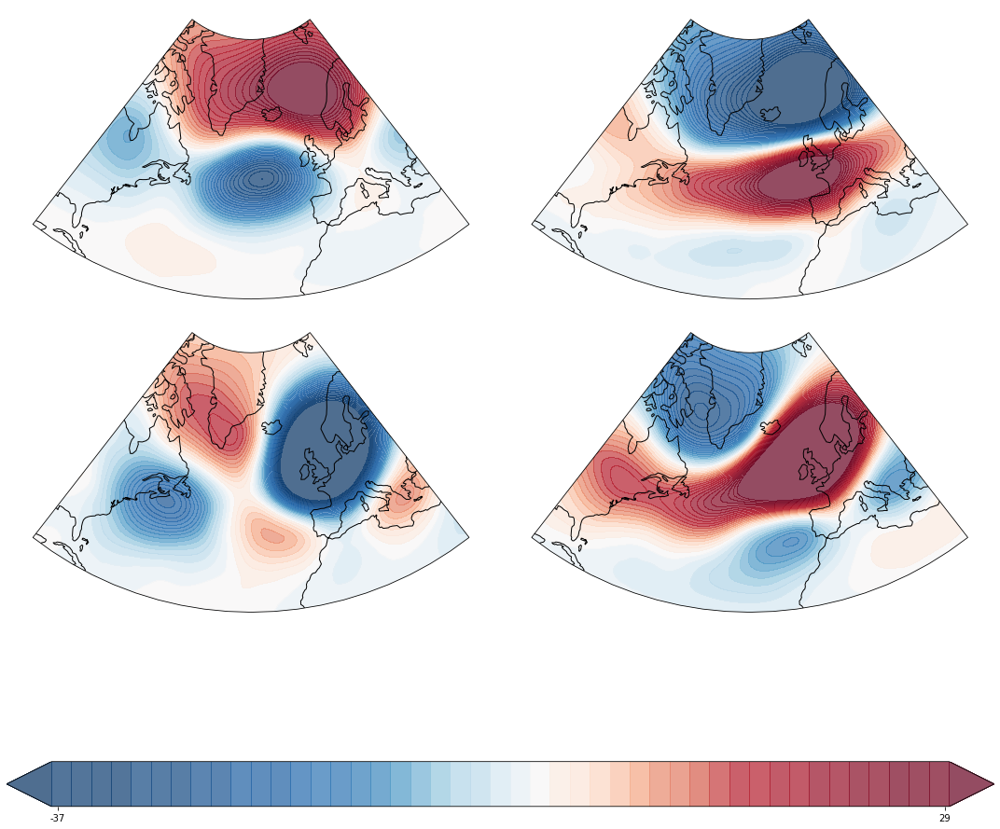

In [16]:
estimator = load_estimator("../models/SUMMER/vae/bayesian_gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

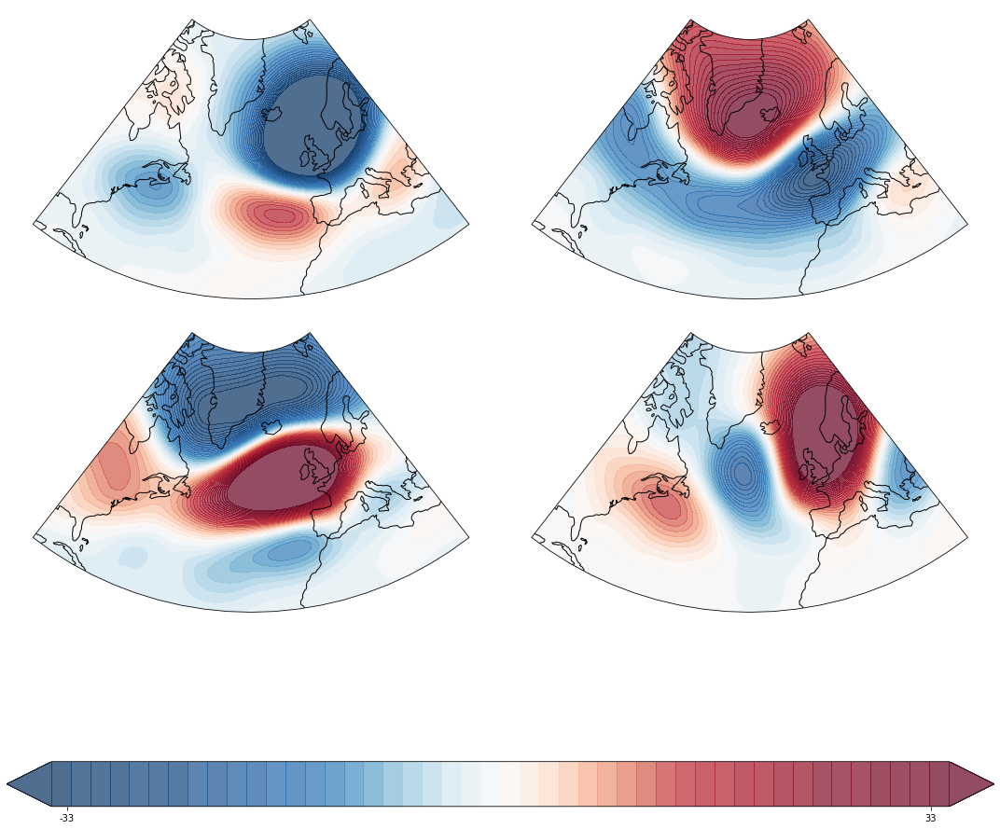

In [17]:
estimator = load_estimator("../models/SUMMER/vae/gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### PCA: 4 Months (15th May - 15th Sept) and 4 Normals

In [43]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_4normals/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_4normals') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-217531.915663,0.067233,69.739260,2.876436e+11
kmeans_model_ch.pkl,4,-217584.918301,0.079402,89.064929,3.044836e+11
kmeans_model_score.pkl,7,-217595.562938,0.060097,61.864244,2.830735e+11
kmeans_model_silhouette.pkl,4,-217584.918291,0.079402,89.064929,3.044836e+11


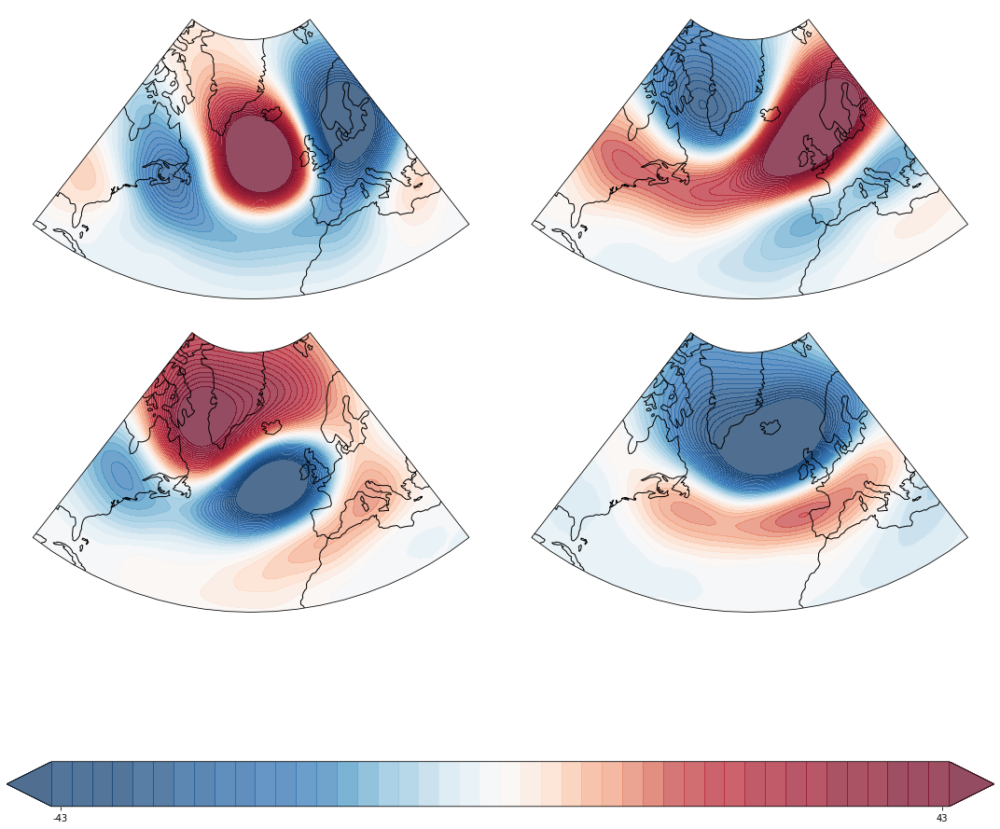

In [44]:
estimator = load_estimator('../models/SUMMER/pca_4months_4normals/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA 4 Months (15th May - 15th Sept) and 1 Normal

In [52]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_1normal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,7,-198504.536556,0.075481,93.236957,2.962523e+11
kmeans_model_ch.pkl,4,-198706.669321,0.081910,136.675618,3.256731e+11
kmeans_model_score.pkl,7,-198504.979985,0.075454,93.235904,2.962459e+11
kmeans_model_silhouette.pkl,5,-198586.838446,0.079221,116.429317,3.135530e+11


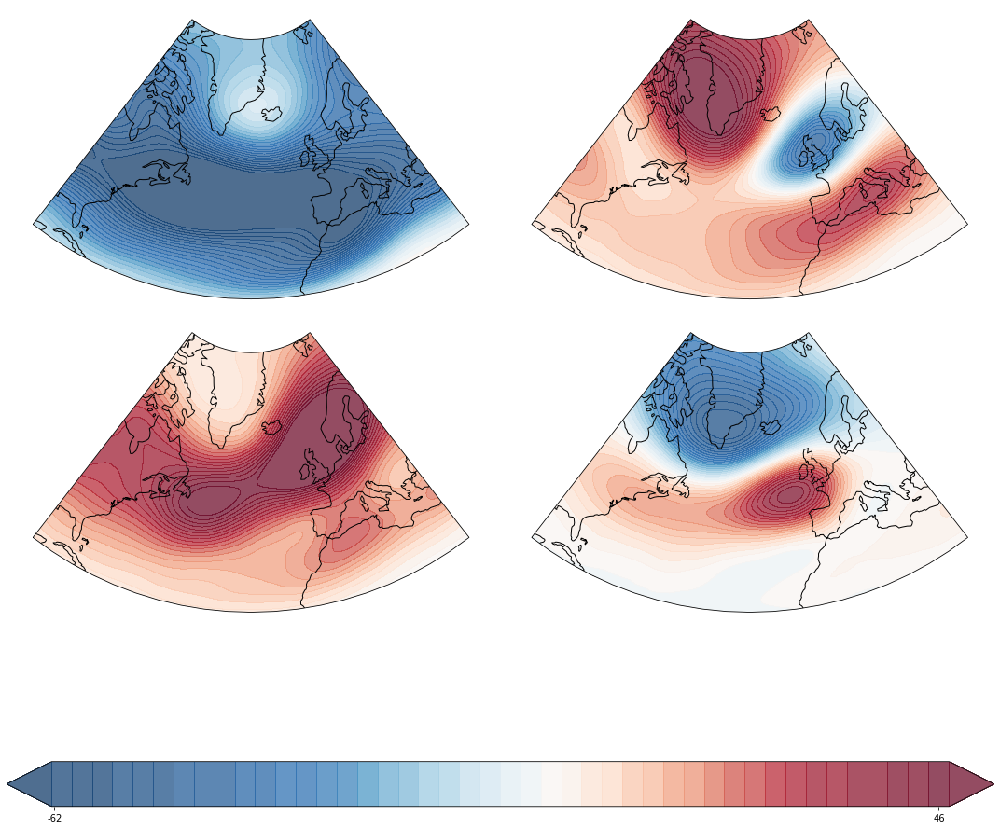

In [53]:
estimator = load_estimator('../models/SUMMER/pca_4months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA 4 Months (15th May - 15th Sept) and Weekly Normal

In [18]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_weeklynormal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_weeklynormal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-216646.773611,0.068318,71.581387,2.658517e+11
kmeans_model_ch.pkl,4,-216813.570914,0.077449,88.488425,2.840987e+11
kmeans_model_score.pkl,7,-216650.550161,0.064913,64.557600,2.603751e+11
kmeans_model_silhouette.pkl,4,-216781.365417,0.078479,89.494530,2.833879e+11


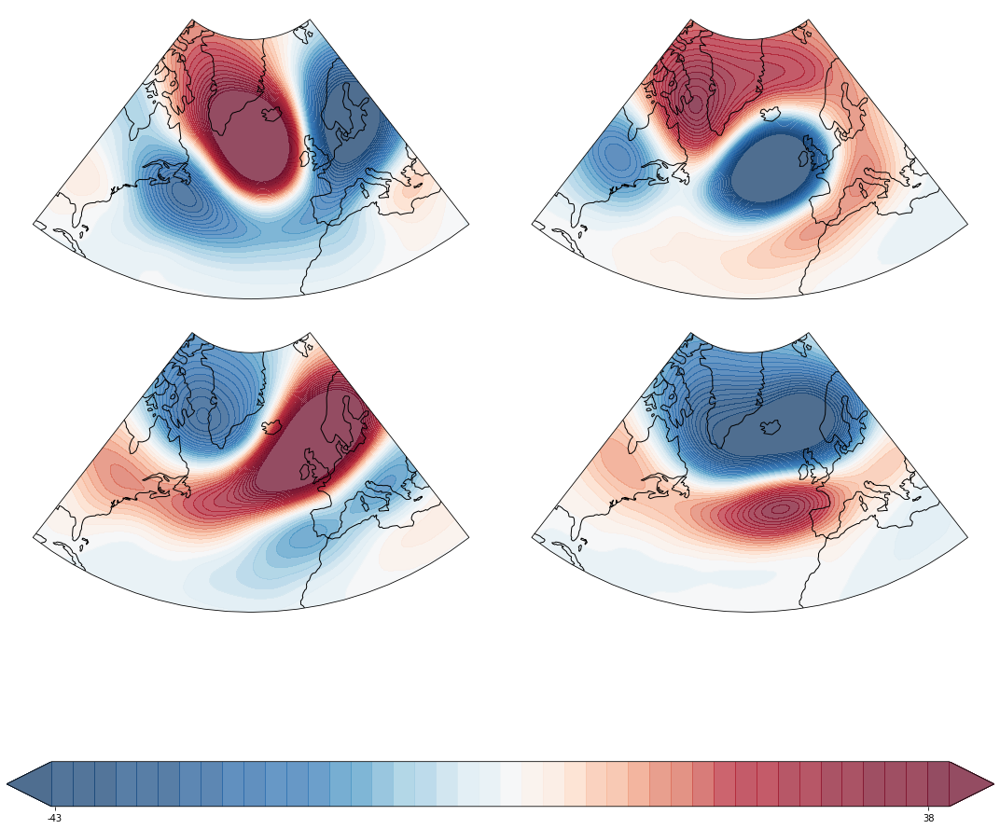

In [20]:
estimator = load_estimator('../models/SUMMER/pca_4months_weeklynormal/kmeans_model_silhouette.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, Aug) and Weekly Normal

In [16]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae_3months/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae_3months') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-32155.848132,0.043787,81.178046,1.447755e+09
bayesian_gmm_model_ch.pkl,5,-32172.837942,0.058635,82.666762,1.330417e+09
bayesian_gmm_model_score.pkl,7,-32344.511426,0.043449,67.496893,1.259868e+09
bayesian_gmm_model_silhouette.pkl,4,-32211.681335,0.042001,70.242106,1.490229e+09
gmm_model_bic.pkl,4,-32236.222260,0.028463,66.163744,1.509246e+09
gmm_model_ch.pkl,4,-32235.253321,0.032263,67.107092,1.507760e+09
gmm_model_score.pkl,5,-32237.988458,0.028153,65.754508,1.510540e+09
gmm_model_silhouette.pkl,4,-32148.087526,0.038685,79.287984,1.452286e+09
kmeans_model_bic.pkl,5,-31679.093699,0.179515,160.655188,1.041997e+09
kmeans_model_ch.pkl,4,-31698.118109,0.173648,168.016343,1.151190e+09


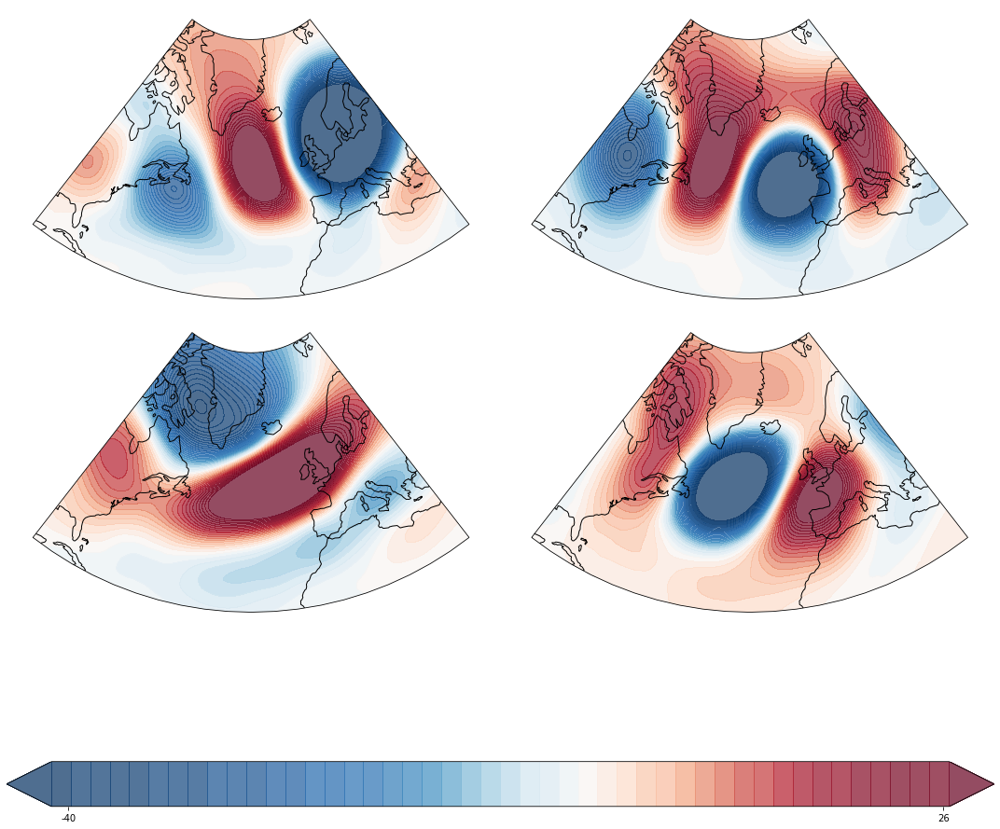

In [18]:
estimator = load_estimator('../models/SUMMER/vae_3months/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



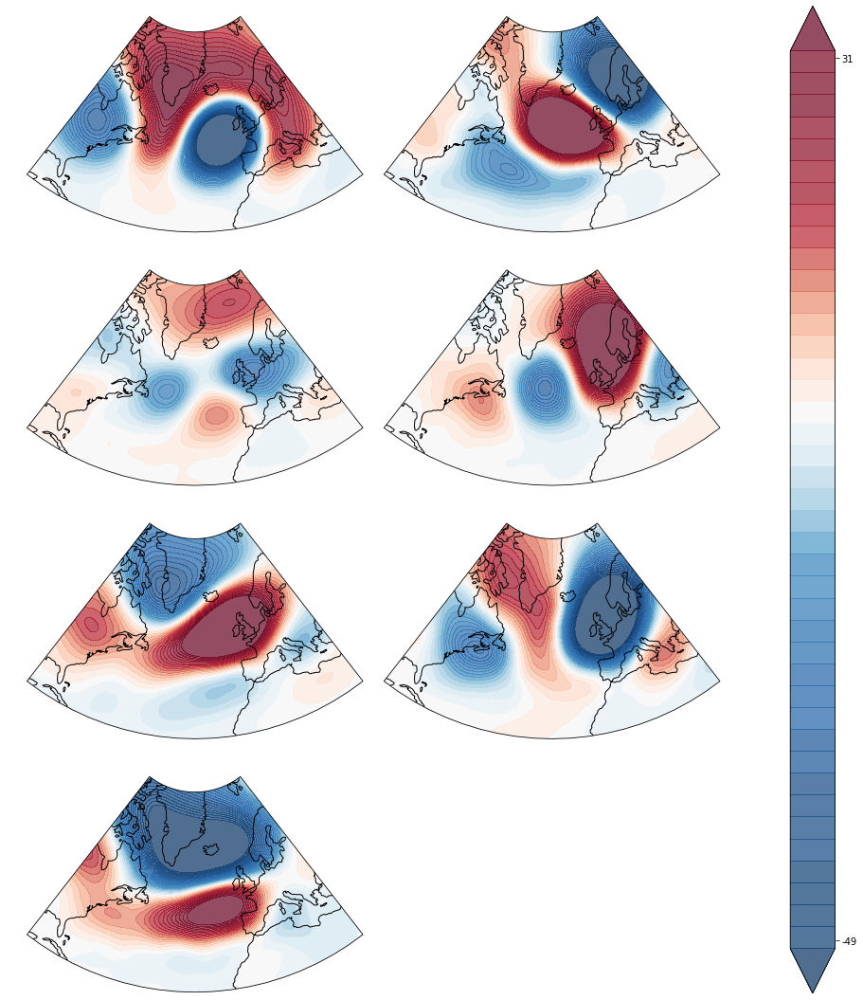

In [26]:
estimator = load_estimator("../models/SUMMER/vae_3months/bayesian_gmm_model_score.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

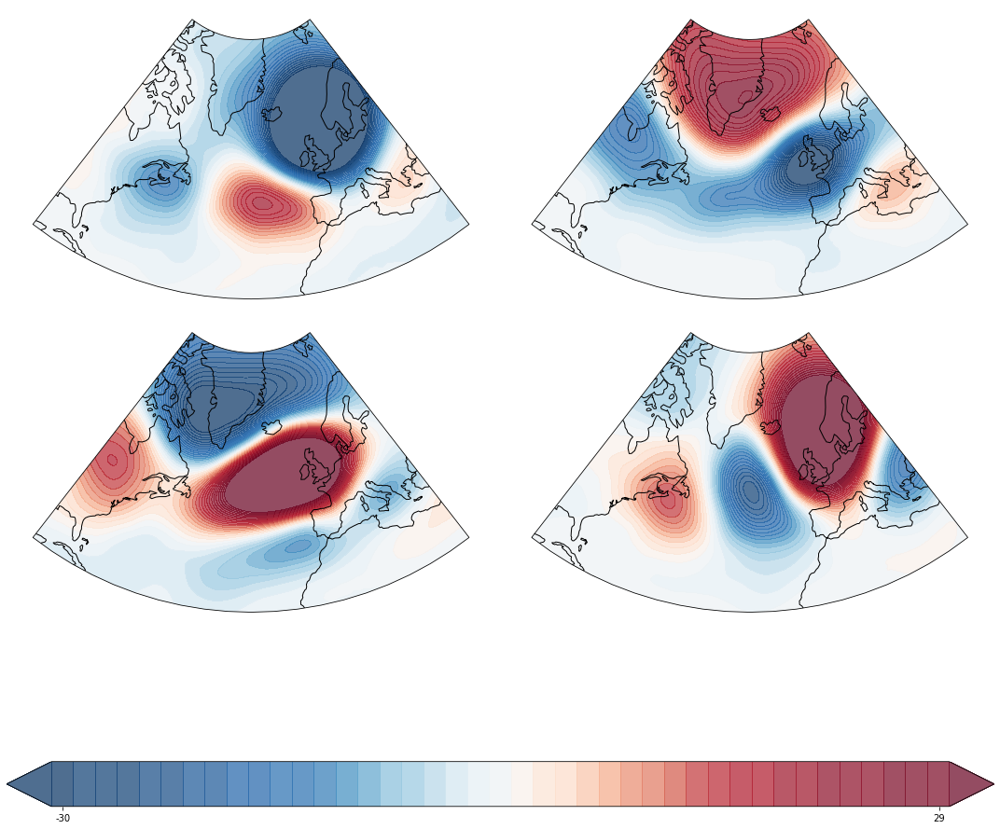

In [20]:
estimator = load_estimator("../models/SUMMER/vae_3months/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, Aug) and 1 Normal

In [13]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae_3months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae_3months_1normal') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-53485.681525,0.090415,319.141505,2.501116e+09
bayesian_gmm_model_ch.pkl,4,-53425.103939,0.032637,330.945508,2.463830e+09
bayesian_gmm_model_score.pkl,6,-53648.936112,0.037728,255.674899,2.192518e+09
bayesian_gmm_model_silhouette.pkl,5,-53539.141569,0.037353,286.628295,2.308010e+09
gmm_model_bic.pkl,4,-53391.174276,0.005078,334.482004,2.451953e+09
gmm_model_ch.pkl,5,-53366.045087,0.006969,340.292875,2.432018e+09
gmm_model_score.pkl,4,-53391.171960,0.005078,334.482004,2.451951e+09
gmm_model_silhouette.pkl,4,-53516.614813,0.068349,314.645226,2.515199e+09
kmeans_model_bic.pkl,5,-52188.345788,0.346482,484.065009,1.753629e+09
kmeans_model_ch.pkl,4,-52237.532443,0.365553,567.015833,1.886440e+09


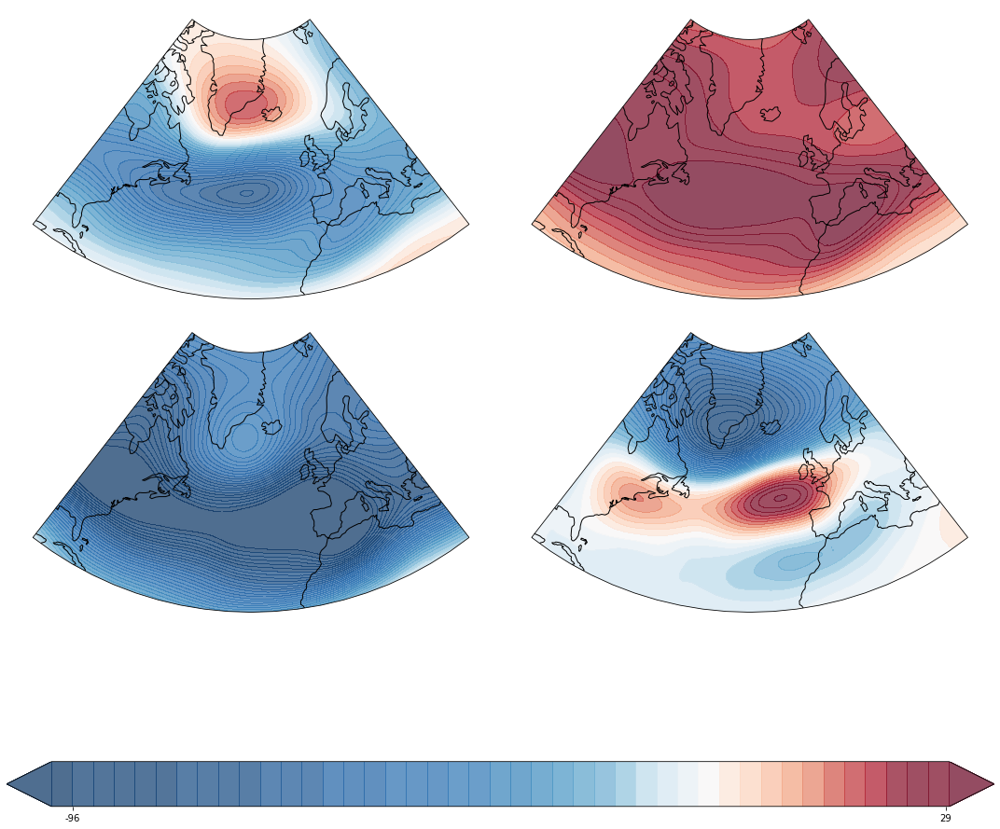

In [14]:
estimator = load_estimator('../models/SUMMER/vae_3months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

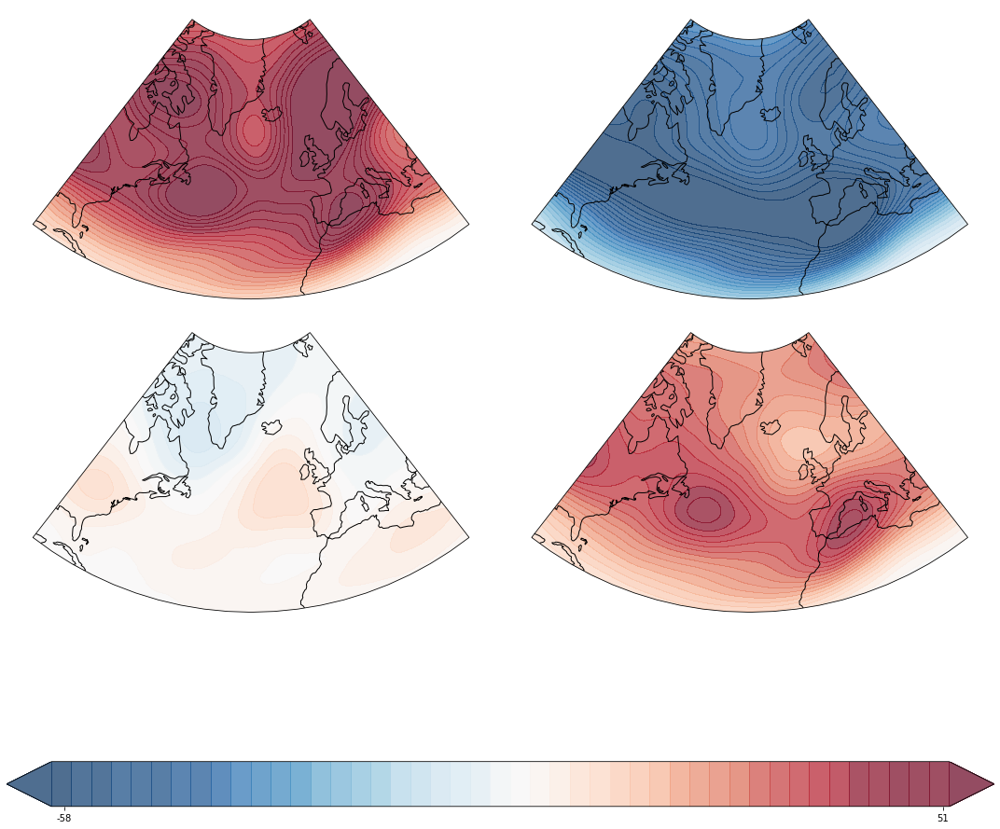

In [15]:
estimator = load_estimator("../models/SUMMER/vae_3months_1normal/gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

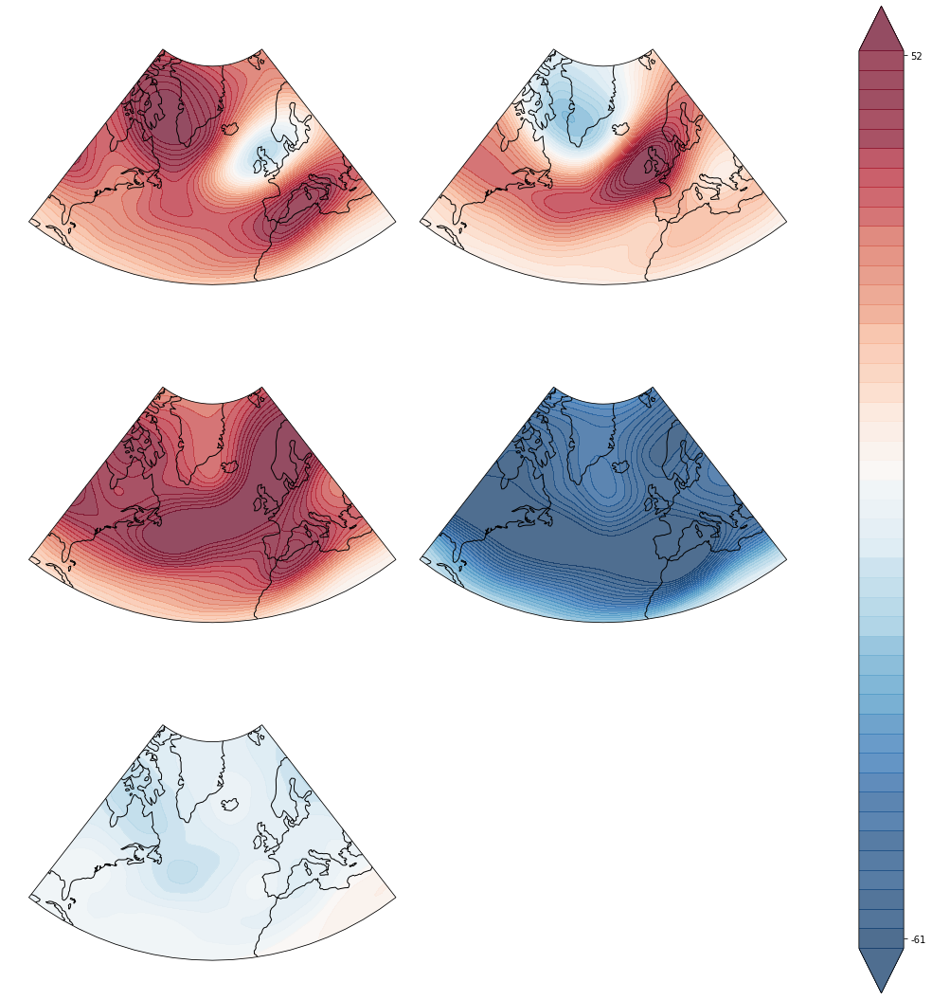

In [16]:
estimator = load_estimator("../models/SUMMER/vae_3months/bayesian_gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 months (June, July, August) and 1 Normal

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-153698.093748,0.076885,65.719487,1.972255e+11
kmeans_model_ch.pkl,4,-153883.797348,0.076163,79.936693,2.138657e+11
kmeans_model_score.pkl,7,-153718.936694,0.068197,59.138357,1.929927e+11
kmeans_model_silhouette.pkl,4,-153883.797360,0.076163,79.936693,2.138657e+11


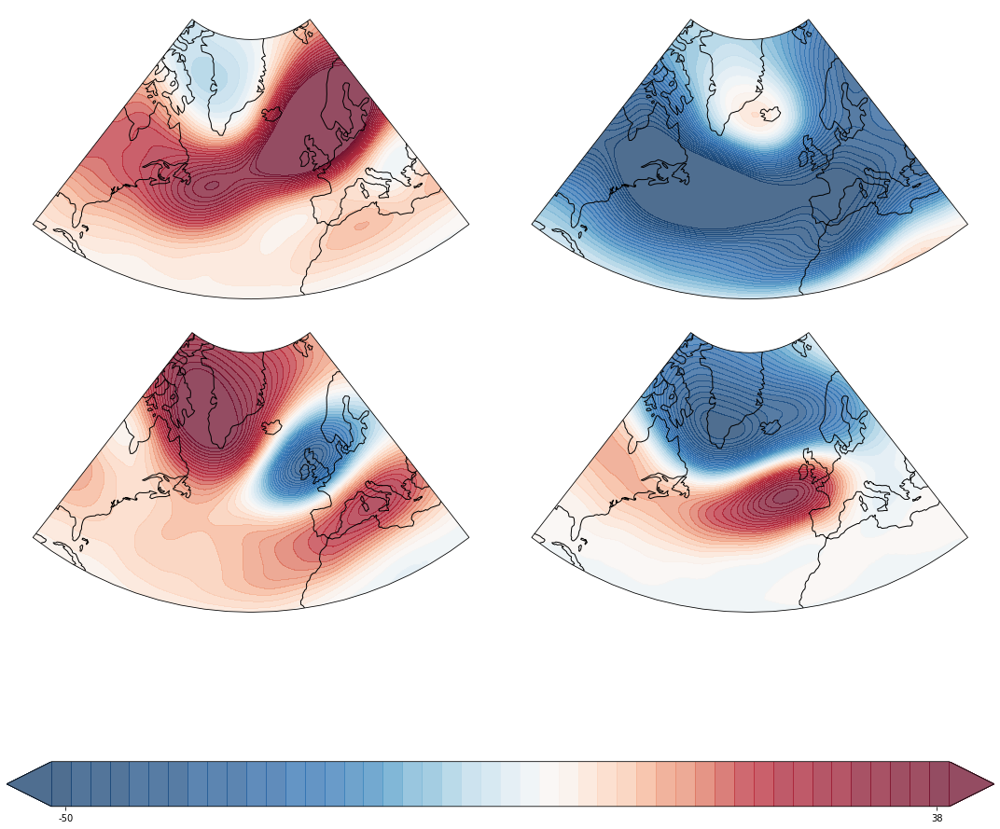

In [14]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August) and 3 Normal (1979-2016)

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_3normal1979-2016/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_3normal1979-2016') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,5,-141934.901162,0.074349,52.535605,1.714010e+11
kmeans_model_ch.pkl,4,-142014.572792,0.075737,57.658831,1.788170e+11
kmeans_model_score.pkl,7,-142048.236442,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,4,-142014.572800,0.075737,57.658831,1.788170e+11


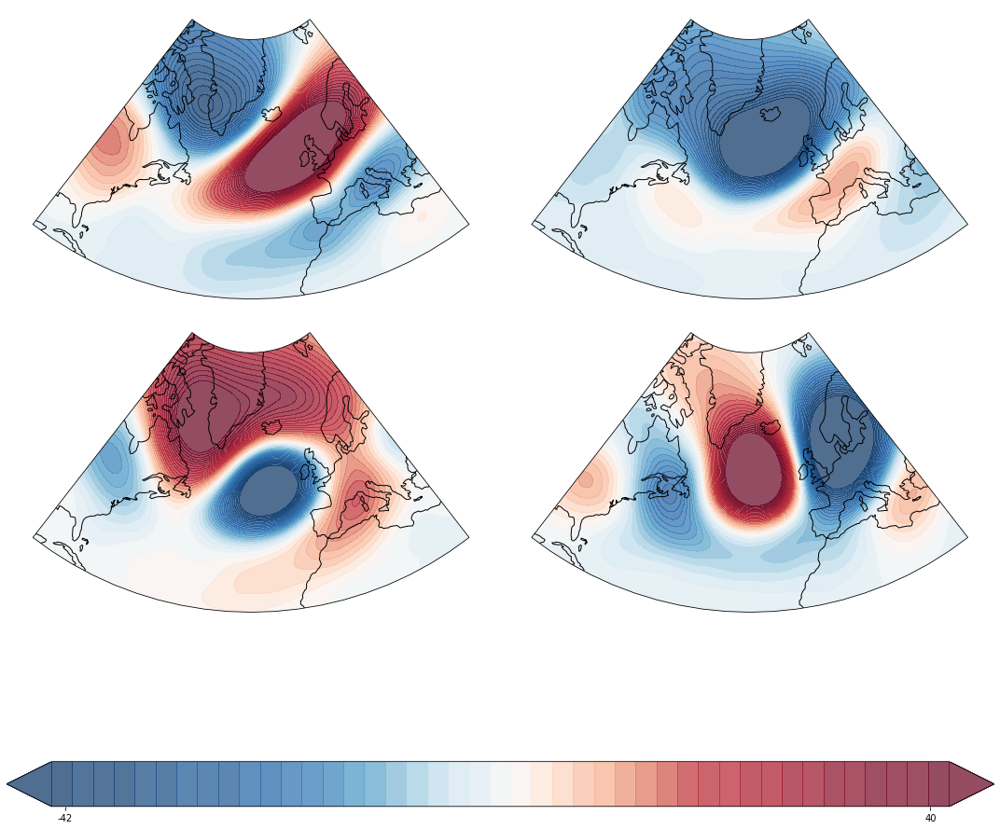

In [15]:
estimator = load_estimator('../models/SUMMER/pca_3months_3normal1979-2016/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August) and 1 Normal (1979-2016)

In [22]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal1979-2016/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal1979-2016') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-141978.240279,0.065363,46.283781,1.677145e+11
kmeans_model_ch.pkl,4,-142015.528482,0.075660,57.794977,1.787594e+11
kmeans_model_score.pkl,7,-142048.236453,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,6,-141988.453502,0.063559,45.965498,1.679497e+11


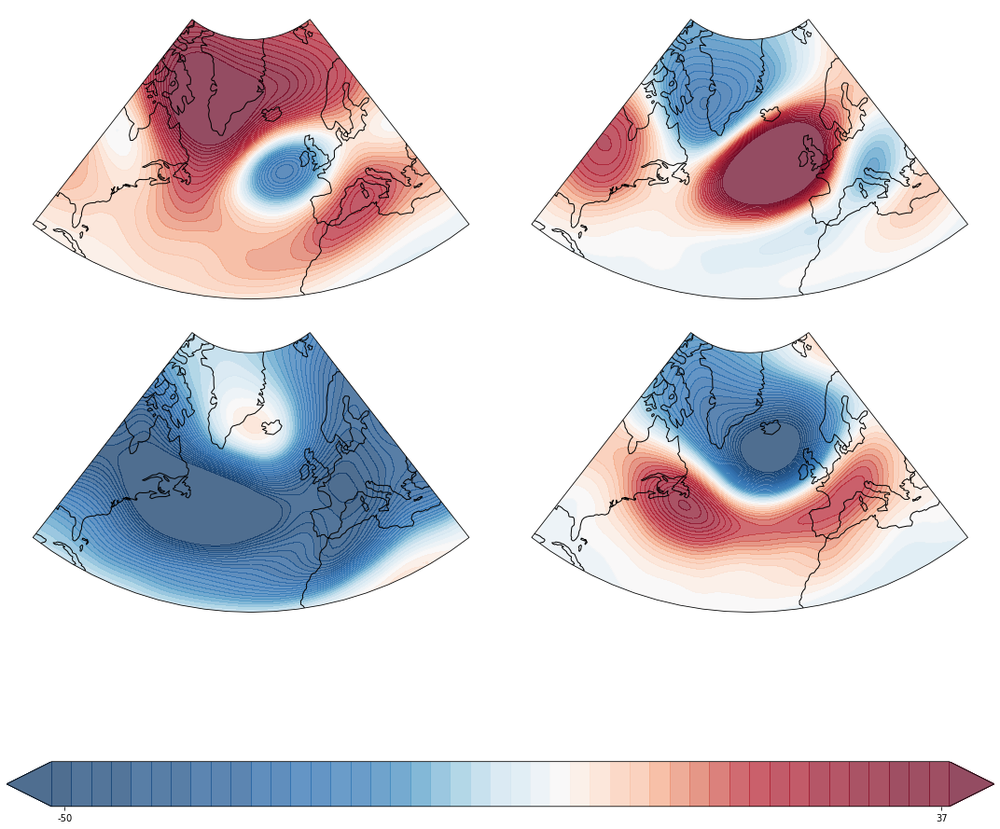

In [23]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal1979-2016/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), 1 Normal and 5 PCs

In [29]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-142013.096633,0.075886,57.910193,1.786960e+11
kmeans_model_ch.pkl,4,-142009.625060,0.075810,57.816571,1.786344e+11
kmeans_model_score.pkl,7,-142048.236435,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,6,-141987.119458,0.063268,45.951859,1.679256e+11


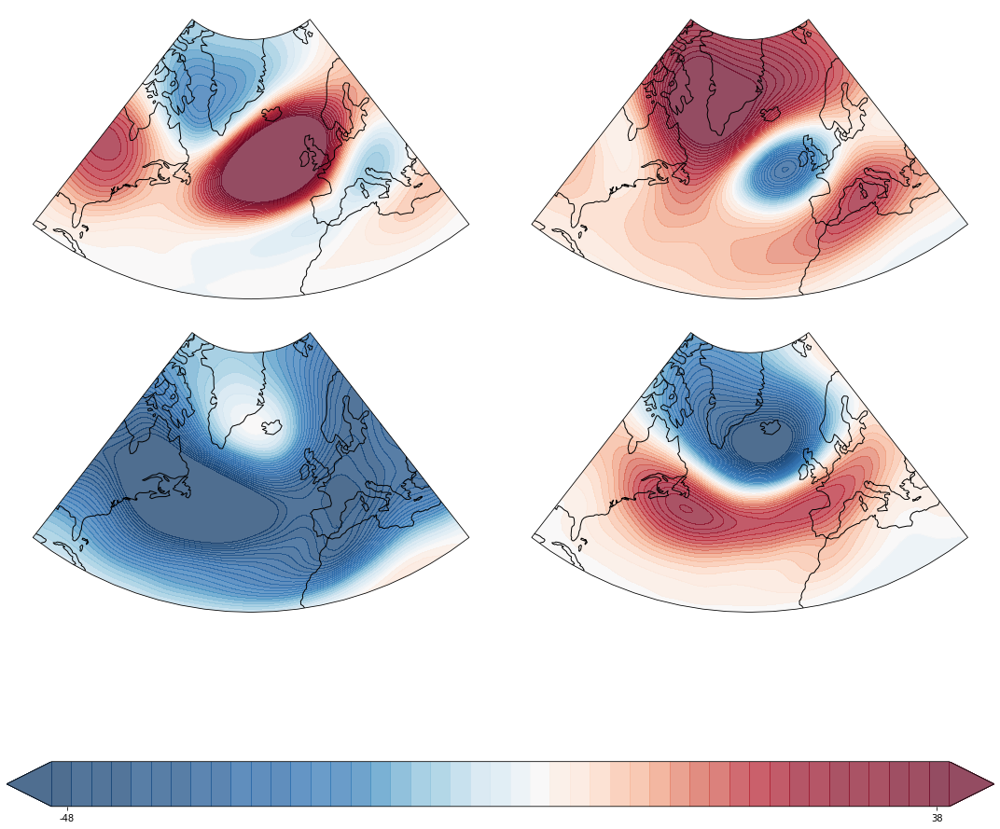

In [30]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal_5pcs/kmeans_model_bic.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), 3 Normal and 5 PCs

In [15]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_3normal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_3normal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-40323.179736,0.152707,145.559035,8.956718e+10
kmeans_model_ch.pkl,4,-40323.179740,0.152707,145.559035,8.956718e+10
kmeans_model_score.pkl,7,-40465.441814,0.139706,114.850073,7.465231e+10
kmeans_model_silhouette.pkl,4,-40319.156171,0.153387,146.302108,8.936578e+10


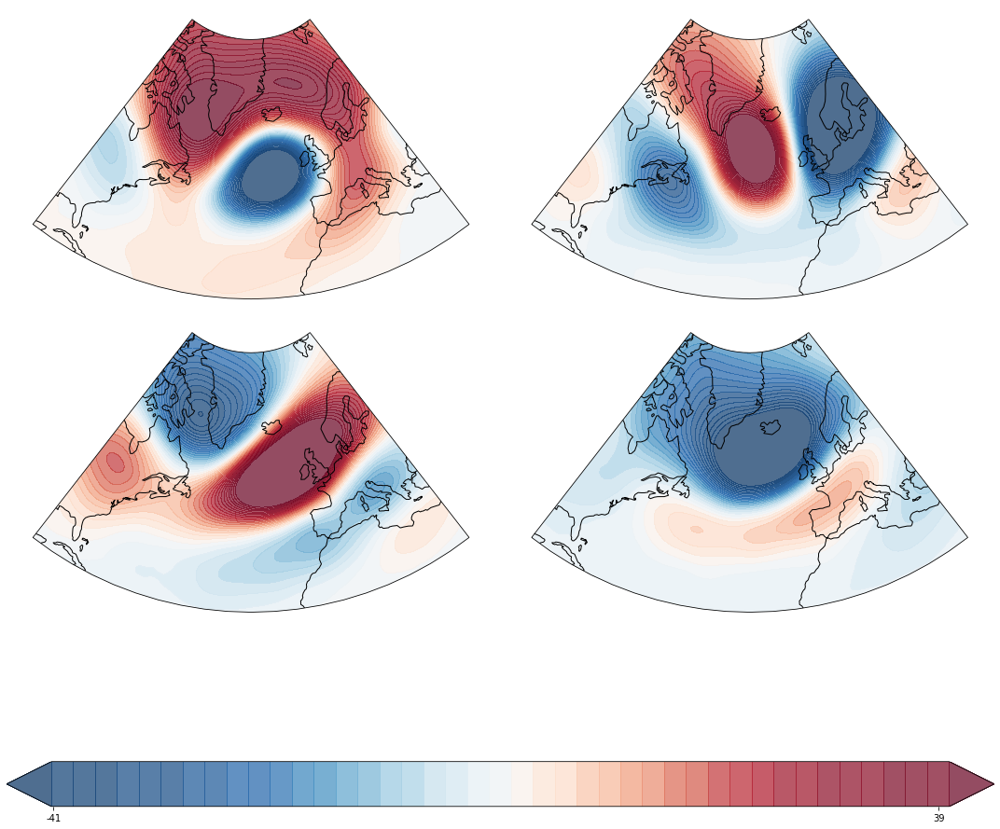

In [16]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal_5pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), Weekly Normal and 5 PCs

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_weeklynormal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_weeklynormal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-38572.391862,0.241493,160.469214,2.476049e+08
kmeans_model_ch.pkl,4,-38572.391862,0.241493,160.469214,2.476049e+08
kmeans_model_score.pkl,7,-38593.576925,0.142869,130.346135,2.011105e+08
kmeans_model_silhouette.pkl,4,-38573.276024,0.241493,160.469214,2.476838e+08


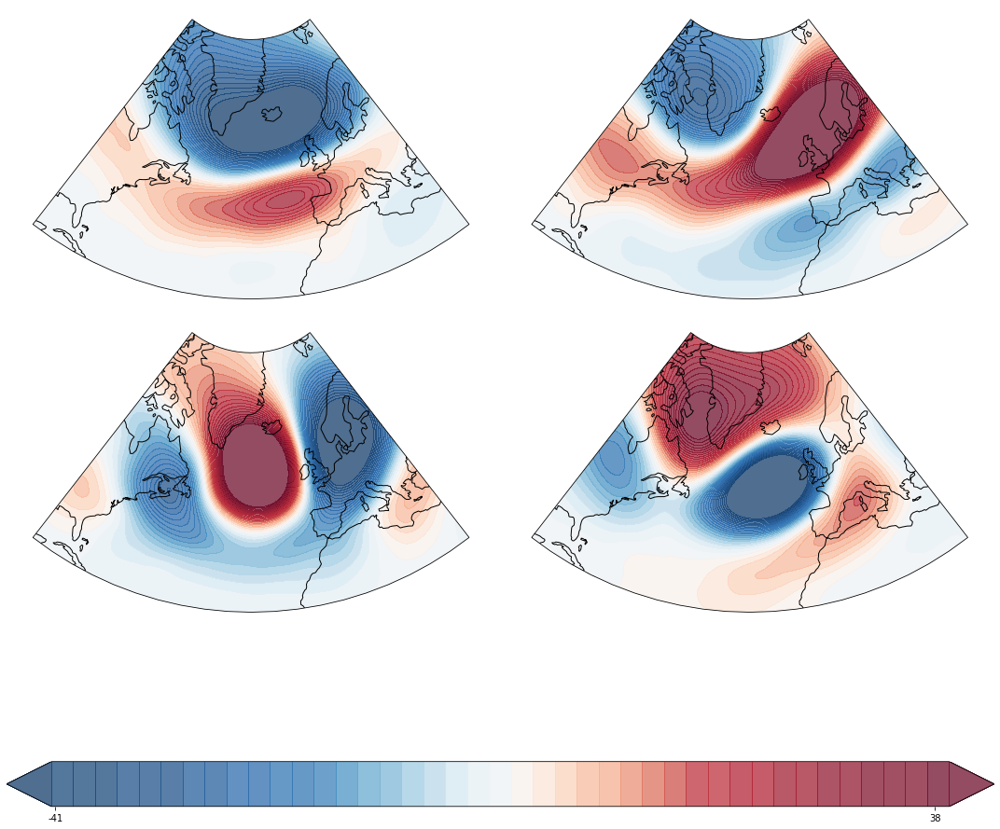

In [26]:
estimator = load_estimator('../models/SUMMER/pca_3months_weeklynormal_5pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, August), Weekly Normal and 7 components

In [28]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae_3months_weeklynormal_7pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae_3months_weeklynormal_7pcs') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-39268.818164,0.036856,92.337384,2.988501e+08
bayesian_gmm_model_ch.pkl,4,-39268.065889,0.037599,92.482760,2.987438e+08
bayesian_gmm_model_score.pkl,7,-39514.037557,0.018801,64.419476,2.721162e+08
bayesian_gmm_model_silhouette.pkl,7,-39500.233877,0.024106,66.206687,2.706076e+08
gmm_model_bic.pkl,4,-39295.887534,0.014444,86.608833,3.036223e+08
gmm_model_ch.pkl,4,-39274.288323,0.047622,92.322617,2.992115e+08
gmm_model_score.pkl,7,-39294.926335,0.014624,86.789156,3.035160e+08
gmm_model_silhouette.pkl,7,-39299.029816,0.034809,88.433105,3.023462e+08
kmeans_model_bic.pkl,6,-38617.760449,0.181958,137.006530,2.180251e+08
kmeans_model_ch.pkl,4,-38634.422231,0.230105,158.881063,2.524021e+08


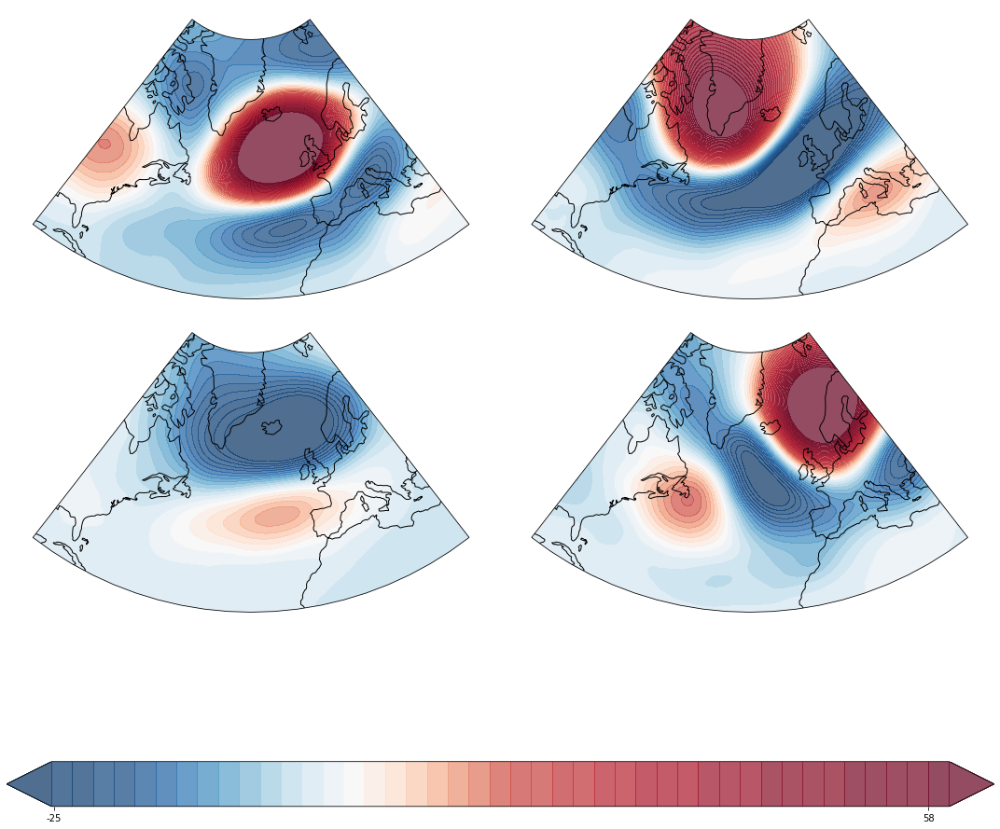

In [29]:
estimator = load_estimator('../models/SUMMER/vae_3months_weeklynormal_7pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

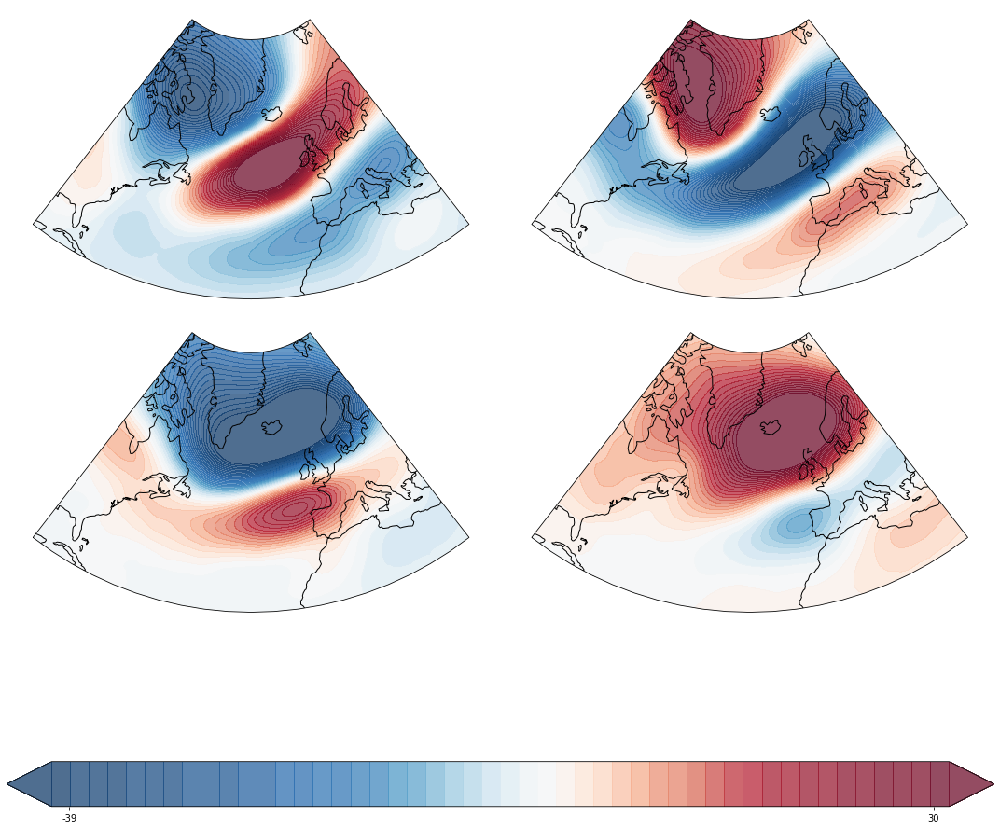

In [30]:
estimator = load_estimator("../models/SUMMER/vae_3months_weeklynormal_7pcs/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

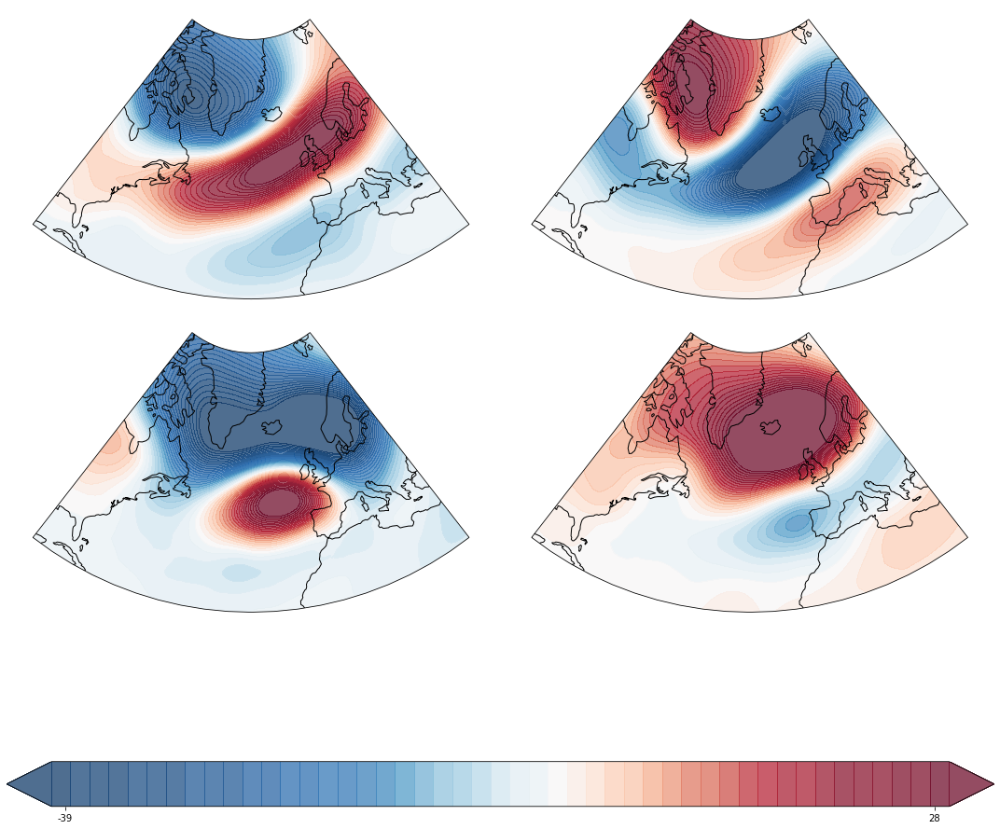

In [31]:
estimator = load_estimator("../models/SUMMER/vae_3months_weeklynormal_7pcs/bayesian_gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

## Reporting of results

Number of days: 3956, Density of the grid: 21 cells
	func:'reduce_dim' took: 9.0307 sec


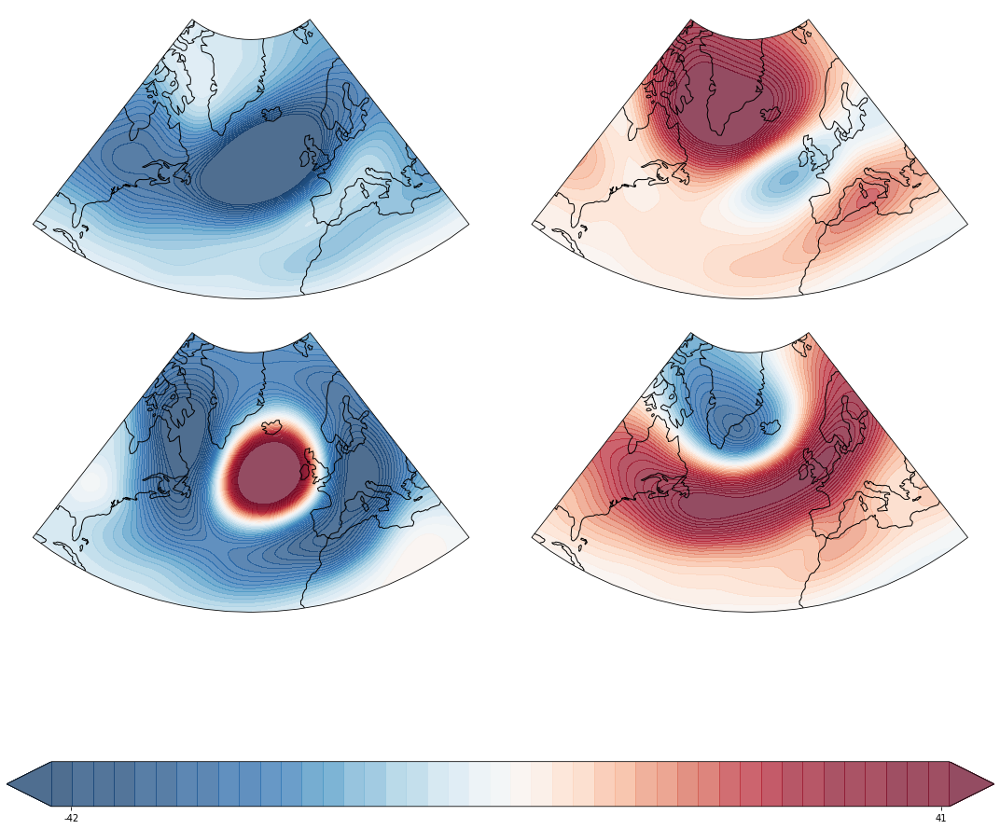

Processing batch 16Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 666.3794 sec


C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1326: RuntimeWarning:

invalid value encountered in log

C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1326: RuntimeWarning:

divide by zero encountered in log

C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1327: RuntimeWarning:

invalid value encountered in multiply



AttributeError: 'NoneType' object has no attribute 'extents'

<Figure size 1080x1080 with 3 Axes>

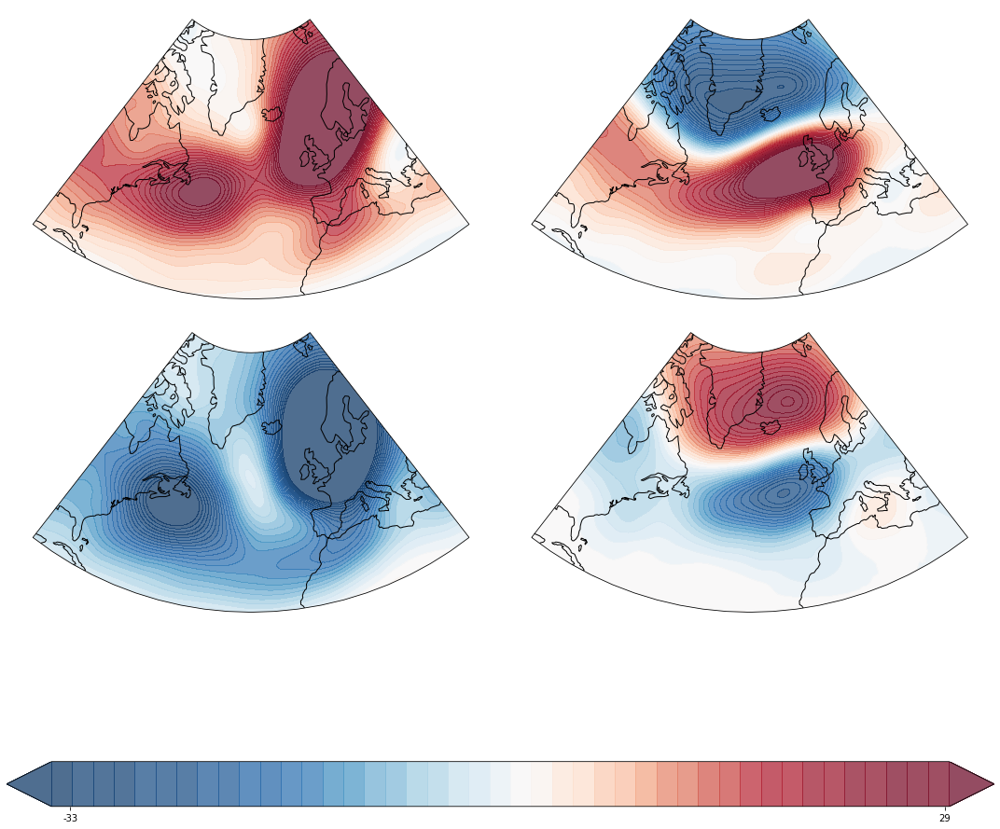

In [25]:
for name, model in zip(['K-Means', 'Bayesian-GMM', 'GMM'],
            ['pca_4months_weeklynormal/kmeans_model_silhouette.pkl',
             'vae_3months_1normal/bayesian_gmm_model_bic.pkl',
             'vae_3months_1normal/gmm_model_ch.pkl']):
    est = load_estimator('../models/SUMMER/'+ model)
    try:
        labels = est.predict(reduced_anomaly.values)
    except:
        if model.startswith('pca'):
            reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance = 21)#exp_variance=0.)
        else:
            reduced_anomaly = reduce_dim(ds, method='VAE', season = 'SUMMER')
        labels = est.predict(reduced_anomaly.values)
        
    plot_regimes(pivot_anomaly, labels)

#

In [47]:
import sys
sys.path.append('../src/')
from modeling.utils.data import *
from modeling.utils.plotting import *
from modeling.utils.config import *
from dashboard.utils.data import *
from dashboard.utils.plotting import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
dt = build_data()
dt = weighted_anomaly(dt)

Reading anomaly from file
	func:'read_nc' took: 0.0000 sec
	func:'build_data' took: 0.0000 sec
	func:'weighted_anomaly' took: 647.0616 sec


In [4]:
pivot_anomaly = flat_table(dt)

	func:'flat_table' took: 0.9175 sec


In [5]:
reduced_anomaly = reduce_dim(pivot_anomaly, method = 'PCA', exp_variance = .9)

Number of days: 3956, Density of the grid: 23 cells
	func:'reduce_dim' took: 93.4329 sec


In [6]:
train_X, test_X, pivot_train, pivot_test = train_test_split(reduced_anomaly, pivot_anomaly, test_size = 0.2, random_state = 42)

In [7]:
estimator = load_estimator(f'../models/{season}/SLP/kmeans_model_ch.pkl')

In [9]:
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs

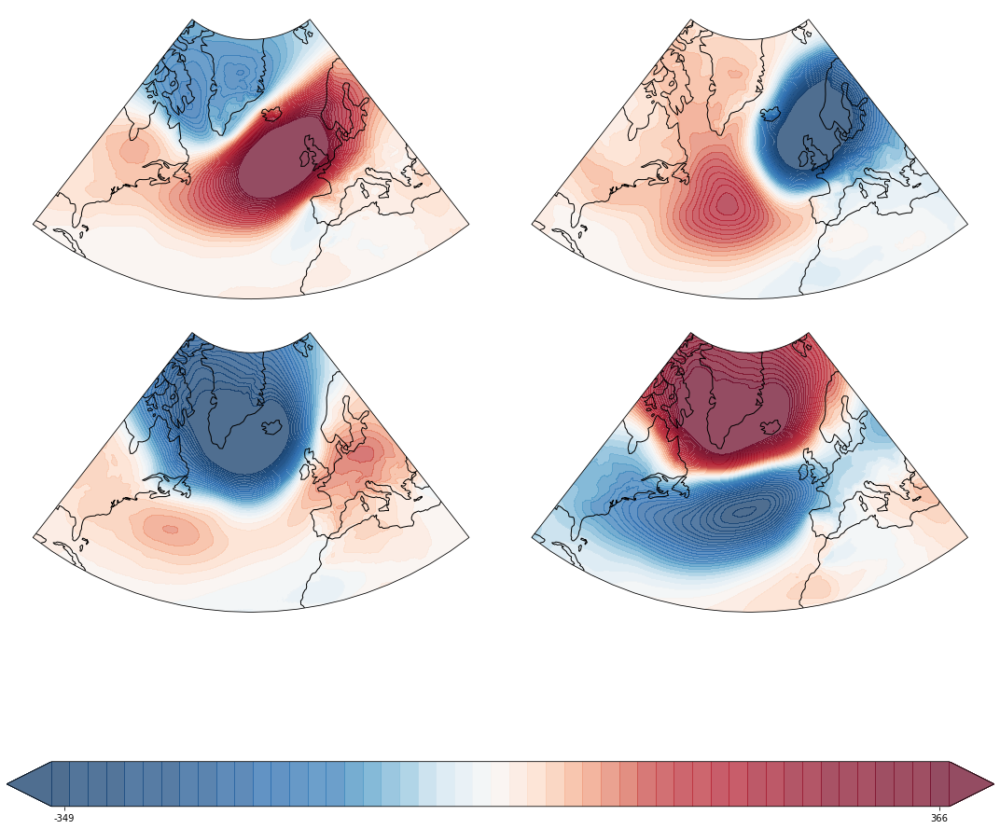

In [10]:
plot_regimes(pivot_anomaly, labels)

In [43]:
clusters = {0: 'SB', 1: 'Zonal', 2:'AL', 3: 'NAO-'}
one_hot = np.zeros((labels.size, labels.max()+1))
one_hot[np.arange(labels.size),labels] = 1        
predictions = pd.DataFrame(one_hot, columns = clusters.values(), index = dt.time.values)
predictions = predictions.reindex(columns = sorted(predictions.columns))
predictions

,AL,NAO-,SB,Zonal
1979-06-01,0.0,1.0,0.0,0.0
1979-06-02,0.0,1.0,0.0,0.0
1979-06-03,0.0,1.0,0.0,0.0
1979-06-04,0.0,0.0,1.0,0.0
1979-06-05,0.0,0.0,1.0,0.0
...,...,...,...,...
2021-08-27,0.0,0.0,1.0,0.0
2021-08-28,0.0,0.0,1.0,0.0
2021-08-29,0.0,0.0,1.0,0.0
2021-08-30,0.0,1.0,0.0,0.0


In [45]:
targets = load_MF_targets.__wrapped__(season = 'Summer')
targets = targets.xs('Distance', axis = 1, level = 0).drop('Prediction', axis = 1)
targets = targets.apply(lambda x: pd.Series(list(map(lambda y: int(y== np.min(x)), x))), axis = 1)
targets.columns = predictions.columns
targets

,AL,NAO-,SB,Zonal
1981-06-01,1,0,0,0
1981-06-02,1,0,0,0
1981-06-03,1,0,0,0
1981-06-04,1,0,0,0
1981-06-05,1,0,0,0
...,...,...,...,...
2020-08-27,0,1,0,0
2020-08-28,0,1,0,0
2020-08-29,0,1,0,0
2020-08-30,1,0,0,0


In [46]:
predictions.mean(0), targets.mean(0)

(AL       0.259858
 NAO-     0.253792
 SB       0.281598
 Zonal    0.204752
 dtype: float64,
 AL       0.239402
 NAO-     0.258967
 SB       0.259239
 Zonal    0.242663
 dtype: float64)

<AxesSubplot:>

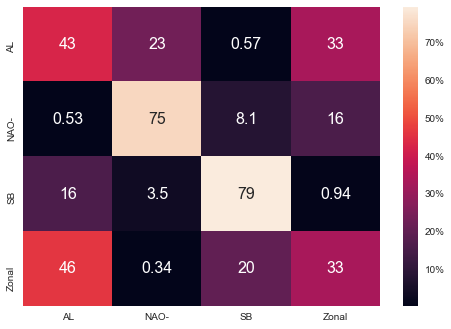

In [55]:
sns.heatmap(
    confusion_matrix(np.argmax(targets.loc[targets.index.intersection(predictions.index)].values, axis = 1),
                     np.argmax(predictions.loc[targets.index.intersection(predictions.index)].values, axis = 1),
                    normalize='true')*100,
    annot=True, cbar_kws={'format': '%.0f%%'}, annot_kws={"size": 16},
    yticklabels=predictions.columns,
    xticklabels=predictions.columns
)